# Proyek Analisis Data: Air-quality-dataset
- **Nama:** Andi Zahrina Athirah Ahmad
- **Email:** azahrinathiraha051@gmail.com
- **ID Dicoding:** azahrnath15

## Menentukan Pertanyaan Bisnis

1. **Bagaimana perubahan tren bulanan konsentrasi polusi udara (PM2.5) di berbagai stasiun pada tahun (2013-2017), dan stasiun mana yang menunjukkan tingkat polusi tertinggi serta terendah?**

  - Pengguna dapat melihat tren bulanan PM2.5 di setiap stasiun untuk tahun tertentu (2013-2017), dengan fluktuasi konsentrasi polusi udara yang terjadi sepanjang bulan Januari hingga Desember.
  - Pengguna dapat mengidentifikasi bulan dengan konsentrasi PM2.5 tertinggi dan terendah di setiap stasiun, serta membandingkannya dengan rata-rata PM2.5 di stasiun lain pada tahun yang sama.

2. **Bagaimana hubungan antara konsentrasi PM2.5 dengan polutan CO, NO2, dan SO2 di berbagai stasiun pada tahun (2013–2017), dan polutan mana yang paling berkorelasi?**
  - Analisis ini bertujuan untuk memahami seberapa kuat keterkaitan antara PM2.5 dan tiga jenis polutan utama lainnya (CO, NO2, SO2) berdasarkan nilai korelasi linier.
  - Pengguna dapat melihat pola hubungan yang terjadi di setiap lokasi pemantauan dari tahun ke tahun, serta mengidentifikasi polutan yang memiliki keterkaitan paling konsisten terhadap fluktuasi PM2.5.

### **Analisis Lanjutan : Geospatial Analysis**

3. **Bagaimana pola spasial konsentrasi PM2.5 berdasarkan musim di seluruh stasiun di Beijing?**
  - Pengguna dapat melihat sebaran rata-rata PM2.5 per musim di setiap stasiun melalui peta interaktif, sekaligus menampilkan informasi nama stasiun, musim, rata-rata PM2.5, dan kategori polusi udara (tinggi, rendah, sedang)

  - Analisis ini membantu mengidentifikasi wilayah rawan polusi secara musiman dan mendukung kebijakan pengendalian polusi berbasis lokasi dan waktu.

## Import Semua Packages/Library yang Digunakan

In [5]:
!pip install geopandas folium

In [6]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import display
import geopandas as gpd
import folium
from folium.plugins import MarkerCluster
from shapely.geometry import Point
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

**Penjelasan:**
- Menggunakan **pandas** untuk manipulasi data.
- Menggunakan **numpy** untuk operasi numerik.
- Menggunakan **matplotlib** dan seaborn untuk visualisasi data.
- Menggunakan **display()** dari IPython untuk menampilkan lebih dari satu output dalam satu cel.
- Menggunakan **geopandas** dan **shapely** untuk analisis spasial dan pengolahan data geografis.
- Menggunakan **folium** dan **MarkerCluster** untuk membuat peta interaktif dan mengelompokkan titik lokasi pada peta.
- Menggunakan **warnings** untuk menyembunyikan pesan FutureWarning agar output lebih bersih.

## Data Wrangling

Di tahap data wrangling ini, kita akan melakukan beberapa proses penting untuk menyiapkan data mentah agar siap dianalisis. Proses ini mencakup gathering data, assessing data, dan cleaning data.

### Gathering Data

Gathering data adalah tahap awal dalam proses data wrangling:

  - Data dikumpulkan dari GitHub dalam format CSV, masing-masing mewakili satu stasiun pemantauan kualitas udara.
  - URL file disusun dalam dictionary file_url, lalu dibaca menggunakan pandas.read_csv() dalam perulangan, dan disimpan ke dictionary df sebagai DataFrame per stasiun.
  - Dengan struktur ini, kita bisa mengakses data tiap stasiun cukup dengan memanggil key-nya, misalnya azx_df untuk stasiun Aotizhongxin.

Tujuan dari tahap ini adalah memastikan semua data berhasil dimuat dan siap digunakan dalam tahap analisis berikutnya.

In [7]:
# Dictionary URL dari setiap stasiun
file_url = {"Aotizhongxin":"https://raw.githubusercontent.com/2209106126-azahrinathirah/dicoding-analisis-data-python/refs/heads/main/data/PRSA_Data_Aotizhongxin_20130301-20170228.csv",
            "Changping":"https://raw.githubusercontent.com/2209106126-azahrinathirah/dicoding-analisis-data-python/refs/heads/main/data/PRSA_Data_Changping_20130301-20170228.csv",
            "Dingling":"https://raw.githubusercontent.com/2209106126-azahrinathirah/dicoding-analisis-data-python/refs/heads/main/data/PRSA_Data_Dingling_20130301-20170228.csv",
            "Dongsi":"https://raw.githubusercontent.com/2209106126-azahrinathirah/dicoding-analisis-data-python/refs/heads/main/data/PRSA_Data_Dongsi_20130301-20170228.csv",
            "Guangyuan":"https://raw.githubusercontent.com/2209106126-azahrinathirah/dicoding-analisis-data-python/refs/heads/main/data/PRSA_Data_Guanyuan_20130301-20170228.csv",
            "Gucheng":"https://raw.githubusercontent.com/2209106126-azahrinathirah/dicoding-analisis-data-python/refs/heads/main/data/PRSA_Data_Gucheng_20130301-20170228.csv",
            "Huairou":"https://raw.githubusercontent.com/2209106126-azahrinathirah/dicoding-analisis-data-python/refs/heads/main/data/PRSA_Data_Huairou_20130301-20170228.csv",
            "Nongzhanguan":"https://raw.githubusercontent.com/2209106126-azahrinathirah/dicoding-analisis-data-python/refs/heads/main/data/PRSA_Data_Nongzhanguan_20130301-20170228.csv",
            "Shunyi":"https://raw.githubusercontent.com/2209106126-azahrinathirah/dicoding-analisis-data-python/refs/heads/main/data/PRSA_Data_Shunyi_20130301-20170228.csv",
            "Tiantan":"https://raw.githubusercontent.com/2209106126-azahrinathirah/dicoding-analisis-data-python/refs/heads/main/data/PRSA_Data_Tiantan_20130301-20170228.csv",
            "Wanliu":"https://raw.githubusercontent.com/2209106126-azahrinathirah/dicoding-analisis-data-python/refs/heads/main/data/PRSA_Data_Wanliu_20130301-20170228.csv",
            "Wangshouxigong":"https://raw.githubusercontent.com/2209106126-azahrinathirah/dicoding-analisis-data-python/refs/heads/main/data/PRSA_Data_Wanshouxigong_20130301-20170228.csv",
           }


**Penjelasan:**
- Dataset berasal dari 12 stasiun pemantauan udara di Beijing.
- Data dimuat langsung dari URL dalam bentuk CSV ke dalam dictionary df, dengan nama setiap stasiun sebagai key.
- Setiap stasiun memiliki DataFrame tersendiri.

In [8]:
# Membuat dictionary untuk menampung DataFrame dari setiap stasiun
df = {}

# Membaca semua file CSV dan memasukkannya ke dalam dictionary dengan nama df sesuai stasiun
for station, url in file_url.items():
    df[station] = pd.read_csv(url)
    print(f"Data untuk stasiun {station} berhasil dimuat.")

# Mengakses DataFrame dari setiap stasiun
azx_df = df["Aotizhongxin"]
cpg_df = df["Changping"]
dgl_df = df["Dingling"]
dgs_df = df["Dongsi"]
gyn_df = df["Guangyuan"]
gch_df = df["Gucheng"]
hru_df = df["Huairou"]
nzg_df = df["Nongzhanguan"]
sny_df = df["Shunyi"]
tnt_df = df["Tiantan"]
wlu_df = df["Wanliu"]
wsg_df = df["Wangshouxigong"]

Data untuk stasiun Aotizhongxin berhasil dimuat.
Data untuk stasiun Changping berhasil dimuat.
Data untuk stasiun Dingling berhasil dimuat.
Data untuk stasiun Dongsi berhasil dimuat.
Data untuk stasiun Guangyuan berhasil dimuat.
Data untuk stasiun Gucheng berhasil dimuat.
Data untuk stasiun Huairou berhasil dimuat.
Data untuk stasiun Nongzhanguan berhasil dimuat.
Data untuk stasiun Shunyi berhasil dimuat.
Data untuk stasiun Tiantan berhasil dimuat.
Data untuk stasiun Wanliu berhasil dimuat.
Data untuk stasiun Wangshouxigong berhasil dimuat.


**Insight:**
- Semua data dari 12 stasiun pemantauan berhasil dimuat dengan baik dan siap untuk dianalisis lebih lanjut.

In [9]:
# Data Stasiun Aotizhongxin
azx_df.head()

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
0,1,2013,3,1,0,4.0,4.0,4.0,7.0,300.0,77.0,-0.7,1023.0,-18.8,0.0,NNW,4.4,Aotizhongxin
1,2,2013,3,1,1,8.0,8.0,4.0,7.0,300.0,77.0,-1.1,1023.2,-18.2,0.0,N,4.7,Aotizhongxin
2,3,2013,3,1,2,7.0,7.0,5.0,10.0,300.0,73.0,-1.1,1023.5,-18.2,0.0,NNW,5.6,Aotizhongxin
3,4,2013,3,1,3,6.0,6.0,11.0,11.0,300.0,72.0,-1.4,1024.5,-19.4,0.0,NW,3.1,Aotizhongxin
4,5,2013,3,1,4,3.0,3.0,12.0,12.0,300.0,72.0,-2.0,1025.2,-19.5,0.0,N,2.0,Aotizhongxin


In [10]:
# Data Stasiun Changping
cpg_df.head()

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
0,1,2013,3,1,0,3.0,6.0,13.0,7.0,300.0,85.0,-2.3,1020.8,-19.7,0.0,E,0.5,Changping
1,2,2013,3,1,1,3.0,3.0,6.0,6.0,300.0,85.0,-2.5,1021.3,-19.0,0.0,ENE,0.7,Changping
2,3,2013,3,1,2,3.0,3.0,22.0,13.0,400.0,74.0,-3.0,1021.3,-19.9,0.0,ENE,0.2,Changping
3,4,2013,3,1,3,3.0,6.0,12.0,8.0,300.0,81.0,-3.6,1021.8,-19.1,0.0,NNE,1.0,Changping
4,5,2013,3,1,4,3.0,3.0,14.0,8.0,300.0,81.0,-3.5,1022.3,-19.4,0.0,N,2.1,Changping


In [11]:
# Data stasiun Dingling
dgl_df.head()

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
0,1,2013,3,1,0,4.0,4.0,3.0,NaN,200.0,82.0,-2.3,1020.8,-19.7,0.0,E,0.5,Dingling
1,2,2013,3,1,1,7.0,7.0,3.0,NaN,200.0,80.0,-2.5,1021.3,-19.0,0.0,ENE,0.7,Dingling
2,3,2013,3,1,2,5.0,5.0,3.0,2.0,200.0,79.0,-3.0,1021.3,-19.9,0.0,ENE,0.2,Dingling
3,4,2013,3,1,3,6.0,6.0,3.0,NaN,200.0,79.0,-3.6,1021.8,-19.1,0.0,NNE,1.0,Dingling
4,5,2013,3,1,4,5.0,5.0,3.0,NaN,200.0,81.0,-3.5,1022.3,-19.4,0.0,N,2.1,Dingling


In [12]:
# Data stasiun Dongsi
dgs_df.head()

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
0,1,2013,3,1,0,9.0,9.0,3.0,17.0,300.0,89.0,-0.5,1024.5,-21.4,0.0,NNW,5.7,Dongsi
1,2,2013,3,1,1,4.0,4.0,3.0,16.0,300.0,88.0,-0.7,1025.1,-22.1,0.0,NW,3.9,Dongsi
2,3,2013,3,1,2,7.0,7.0,NaN,17.0,300.0,60.0,-1.2,1025.3,-24.6,0.0,NNW,5.3,Dongsi
3,4,2013,3,1,3,3.0,3.0,5.0,18.0,NaN,NaN,-1.4,1026.2,-25.5,0.0,N,4.9,Dongsi
4,5,2013,3,1,4,3.0,3.0,7.0,NaN,200.0,84.0,-1.9,1027.1,-24.5,0.0,NNW,3.2,Dongsi


In [13]:
# Data stasiun Guangyuan
gyn_df.head()

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
0,1,2013,3,1,0,4.0,4.0,14.0,20.0,300.0,69.0,-0.7,1023.0,-18.8,0.0,NNW,4.4,Guanyuan
1,2,2013,3,1,1,4.0,4.0,13.0,17.0,300.0,72.0,-1.1,1023.2,-18.2,0.0,N,4.7,Guanyuan
2,3,2013,3,1,2,3.0,3.0,10.0,19.0,300.0,69.0,-1.1,1023.5,-18.2,0.0,NNW,5.6,Guanyuan
3,4,2013,3,1,3,3.0,6.0,7.0,24.0,400.0,62.0,-1.4,1024.5,-19.4,0.0,NW,3.1,Guanyuan
4,5,2013,3,1,4,3.0,6.0,5.0,14.0,400.0,71.0,-2.0,1025.2,-19.5,0.0,N,2.0,Guanyuan


In [14]:
# Data stasiun Gucheng
gch_df.head()

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
0,1,2013,3,1,0,6.0,18.0,5.0,NaN,800.0,88.0,0.1,1021.1,-18.6,0.0,NW,4.4,Gucheng
1,2,2013,3,1,1,6.0,15.0,5.0,NaN,800.0,88.0,-0.3,1021.5,-19.0,0.0,NW,4.0,Gucheng
2,3,2013,3,1,2,5.0,18.0,NaN,NaN,700.0,52.0,-0.7,1021.5,-19.8,0.0,WNW,4.6,Gucheng
3,4,2013,3,1,3,6.0,20.0,6.0,NaN,NaN,NaN,-1.0,1022.7,-21.2,0.0,W,2.8,Gucheng
4,5,2013,3,1,4,5.0,17.0,5.0,NaN,600.0,73.0,-1.3,1023.0,-21.4,0.0,WNW,3.6,Gucheng


In [15]:
# Data stasiun Huairou
hru_df.head()

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
0,1,2013,3,1,0,7.0,7.0,3.0,2.0,100.0,91.0,-2.3,1020.3,-20.7,0.0,WNW,3.1,Huairou
1,2,2013,3,1,1,4.0,4.0,3.0,NaN,100.0,92.0,-2.7,1020.8,-20.5,0.0,NNW,1.5,Huairou
2,3,2013,3,1,2,4.0,4.0,NaN,NaN,100.0,91.0,-3.2,1020.6,-21.4,0.0,NW,1.8,Huairou
3,4,2013,3,1,3,3.0,3.0,3.0,2.0,NaN,NaN,-3.3,1021.3,-23.7,0.0,NNW,2.4,Huairou
4,5,2013,3,1,4,3.0,3.0,7.0,NaN,300.0,86.0,-4.1,1022.1,-22.7,0.0,NNW,2.2,Huairou


In [16]:
# Data stasiun Nongzhanguan
nzg_df.head()

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
0,1,2013,3,1,0,5.0,14.0,4.0,12.0,200.0,85.0,-0.5,1024.5,-21.4,0.0,NNW,5.7,Nongzhanguan
1,2,2013,3,1,1,8.0,12.0,6.0,14.0,200.0,84.0,-0.7,1025.1,-22.1,0.0,NW,3.9,Nongzhanguan
2,3,2013,3,1,2,3.0,6.0,5.0,14.0,200.0,83.0,-1.2,1025.3,-24.6,0.0,NNW,5.3,Nongzhanguan
3,4,2013,3,1,3,5.0,5.0,5.0,14.0,200.0,84.0,-1.4,1026.2,-25.5,0.0,N,4.9,Nongzhanguan
4,5,2013,3,1,4,5.0,5.0,6.0,21.0,200.0,77.0,-1.9,1027.1,-24.5,0.0,NNW,3.2,Nongzhanguan


In [17]:
# Data stasiun Shunyi
sny_df.head()

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
0,1,2013,3,1,0,3.0,6.0,3.0,8.0,300.0,44.0,-0.9,1025.8,-20.5,0.0,NW,9.3,Shunyi
1,2,2013,3,1,1,12.0,12.0,3.0,7.0,300.0,47.0,-1.1,1026.1,-21.3,0.0,NW,9.4,Shunyi
2,3,2013,3,1,2,14.0,14.0,NaN,7.0,200.0,22.0,-1.7,1026.2,-23.0,0.0,NW,8.6,Shunyi
3,4,2013,3,1,3,12.0,12.0,3.0,5.0,NaN,NaN,-2.1,1027.3,-23.3,0.0,NW,6.6,Shunyi
4,5,2013,3,1,4,12.0,12.0,3.0,NaN,200.0,11.0,-2.4,1027.7,-22.9,0.0,NW,4.5,Shunyi


In [18]:
# Data stasiun Tiantan
tnt_df.head()

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
0,1,2013,3,1,0,6.0,6.0,4.0,8.0,300.0,81.0,-0.5,1024.5,-21.4,0.0,NNW,5.7,Tiantan
1,2,2013,3,1,1,6.0,29.0,5.0,9.0,300.0,80.0,-0.7,1025.1,-22.1,0.0,NW,3.9,Tiantan
2,3,2013,3,1,2,6.0,6.0,4.0,12.0,300.0,75.0,-1.2,1025.3,-24.6,0.0,NNW,5.3,Tiantan
3,4,2013,3,1,3,6.0,6.0,4.0,12.0,300.0,74.0,-1.4,1026.2,-25.5,0.0,N,4.9,Tiantan
4,5,2013,3,1,4,5.0,5.0,7.0,15.0,400.0,70.0,-1.9,1027.1,-24.5,0.0,NNW,3.2,Tiantan


In [19]:
# Data stasiun Wanliu
wlu_df.head()

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
0,1,2013,3,1,0,8.0,8.0,6.0,28.0,400.0,52.0,-0.7,1023.0,-18.8,0.0,NNW,4.4,Wanliu
1,2,2013,3,1,1,9.0,9.0,6.0,28.0,400.0,50.0,-1.1,1023.2,-18.2,0.0,N,4.7,Wanliu
2,3,2013,3,1,2,3.0,6.0,NaN,19.0,400.0,55.0,-1.1,1023.5,-18.2,0.0,NNW,5.6,Wanliu
3,4,2013,3,1,3,11.0,30.0,8.0,14.0,NaN,NaN,-1.4,1024.5,-19.4,0.0,NW,3.1,Wanliu
4,5,2013,3,1,4,3.0,13.0,9.0,NaN,300.0,54.0,-2.0,1025.2,-19.5,0.0,N,2.0,Wanliu


In [20]:
# Data stasiun Wangshouxigong
wsg_df.head()

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
0,1,2013,3,1,0,9.0,9.0,6.0,17.0,200.0,62.0,0.3,1021.9,-19.0,0.0,WNW,2.0,Wanshouxigong
1,2,2013,3,1,1,11.0,11.0,7.0,14.0,200.0,66.0,-0.1,1022.4,-19.3,0.0,WNW,4.4,Wanshouxigong
2,3,2013,3,1,2,8.0,8.0,NaN,16.0,200.0,59.0,-0.6,1022.6,-19.7,0.0,WNW,4.7,Wanshouxigong
3,4,2013,3,1,3,8.0,8.0,3.0,16.0,NaN,NaN,-0.7,1023.5,-20.9,0.0,NW,2.6,Wanshouxigong
4,5,2013,3,1,4,8.0,8.0,3.0,NaN,300.0,36.0,-0.9,1024.1,-21.7,0.0,WNW,2.5,Wanshouxigong


**Insight:**

- Jumlah dan cakupan data
  - Data yang dikumpulkan berasal dari berbagai stasiun pemantauan di wilayah yang berbeda. Setiap stasiun memiliki rentang data tahun 2013-2017, memungkinkan untuk menganalisis tren jangka panjang. Dengan penggabungan informasi waktu (year/month/day/hour), maka dapat dengan mudah melihat tren harian, bulanan, dan tahunan.
  
- Kelengkapan data
  - Mayoritas stasiun memiliki data yang relatif lengkap dengan variabel penting seperti PM2.5, suhu (TEMP), kelembapan (DEWP), kecepatan angin (WSPM), dan gas-gas polutan (SO2, NO2, CO, O3). .Kelengkapan ini memungkinkan analisis hubungan antara polutan.
  
- Variasi antar stasiun
  - Setiap stasiun mencatat variabel yang sama, namun terdapat variasi signifikan pada konsentrasi polutan atau kondisi cuaca antar wilayah. Ini memberikan dasar yang kuat untuk melihat bagaimana kondisi cuaca berkontribusi pada perubahan tingkat polusi di lokasi yang berbeda.





### Assessing Data

Tahapan setelah Gathering Data yang tidak kalah penting yaitu Assessing Data

  - Pada tahap ini, kita memeriksa data yang sudah dimuat untuk mengetahui apakah ada masalah, seperti nilai kosong (missing value), data duplikat, atau kesalahan tipe data.
  - Selain itu, kita juga melihat deskripsi statistik dasar dari setiap kolom untuk memahami distribusi data, nilai ekstrem, dan sebaran nilainya.
  - Pemeriksaan dilakukan menggunakan fungsi seperti .info(), .describe(), .isnull().sum(), dan .duplicated().

Tujuannya tahapan ini adalah untuk mengidentifikasi bagian data yang perlu dibersihkan atau diperbaiki sebelum dianalisis lebih lanjut.

#### Melihat Struktur Data

Melihat struktur data adalah langkah awal yang penting untuk memahami bentuk, ukuran, dan tipe data dalam dataset sebelum melakukan analisis lebih lanjut.

In [21]:
# Data Stasiun Aotizhongxin
azx_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35064 entries, 0 to 35063
Data columns (total 18 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   No       35064 non-null  int64  
 1   year     35064 non-null  int64  
 2   month    35064 non-null  int64  
 3   day      35064 non-null  int64  
 4   hour     35064 non-null  int64  
 5   PM2.5    34139 non-null  float64
 6   PM10     34346 non-null  float64
 7   SO2      34129 non-null  float64
 8   NO2      34041 non-null  float64
 9   CO       33288 non-null  float64
 10  O3       33345 non-null  float64
 11  TEMP     35044 non-null  float64
 12  PRES     35044 non-null  float64
 13  DEWP     35044 non-null  float64
 14  RAIN     35044 non-null  float64
 15  wd       34983 non-null  object 
 16  WSPM     35050 non-null  float64
 17  station  35064 non-null  object 
dtypes: float64(11), int64(5), object(2)
memory usage: 4.8+ MB


In [22]:
# Data Stasiun Changping
cpg_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35064 entries, 0 to 35063
Data columns (total 18 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   No       35064 non-null  int64  
 1   year     35064 non-null  int64  
 2   month    35064 non-null  int64  
 3   day      35064 non-null  int64  
 4   hour     35064 non-null  int64  
 5   PM2.5    34290 non-null  float64
 6   PM10     34482 non-null  float64
 7   SO2      34436 non-null  float64
 8   NO2      34397 non-null  float64
 9   CO       33543 non-null  float64
 10  O3       34460 non-null  float64
 11  TEMP     35011 non-null  float64
 12  PRES     35014 non-null  float64
 13  DEWP     35011 non-null  float64
 14  RAIN     35013 non-null  float64
 15  wd       34924 non-null  object 
 16  WSPM     35021 non-null  float64
 17  station  35064 non-null  object 
dtypes: float64(11), int64(5), object(2)
memory usage: 4.8+ MB


In [23]:
# Data Stasiun Dingling
dgl_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35064 entries, 0 to 35063
Data columns (total 18 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   No       35064 non-null  int64  
 1   year     35064 non-null  int64  
 2   month    35064 non-null  int64  
 3   day      35064 non-null  int64  
 4   hour     35064 non-null  int64  
 5   PM2.5    34285 non-null  float64
 6   PM10     34408 non-null  float64
 7   SO2      34334 non-null  float64
 8   NO2      33830 non-null  float64
 9   CO       33052 non-null  float64
 10  O3       33850 non-null  float64
 11  TEMP     35011 non-null  float64
 12  PRES     35014 non-null  float64
 13  DEWP     35011 non-null  float64
 14  RAIN     35013 non-null  float64
 15  wd       34924 non-null  object 
 16  WSPM     35021 non-null  float64
 17  station  35064 non-null  object 
dtypes: float64(11), int64(5), object(2)
memory usage: 4.8+ MB


In [24]:
# Data Stasiun Dongsi
dgs_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35064 entries, 0 to 35063
Data columns (total 18 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   No       35064 non-null  int64  
 1   year     35064 non-null  int64  
 2   month    35064 non-null  int64  
 3   day      35064 non-null  int64  
 4   hour     35064 non-null  int64  
 5   PM2.5    34314 non-null  float64
 6   PM10     34511 non-null  float64
 7   SO2      34401 non-null  float64
 8   NO2      33463 non-null  float64
 9   CO       31867 non-null  float64
 10  O3       34400 non-null  float64
 11  TEMP     35044 non-null  float64
 12  PRES     35044 non-null  float64
 13  DEWP     35044 non-null  float64
 14  RAIN     35044 non-null  float64
 15  wd       34986 non-null  object 
 16  WSPM     35050 non-null  float64
 17  station  35064 non-null  object 
dtypes: float64(11), int64(5), object(2)
memory usage: 4.8+ MB


In [25]:
# Data Stasiun Guangyuan
gyn_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35064 entries, 0 to 35063
Data columns (total 18 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   No       35064 non-null  int64  
 1   year     35064 non-null  int64  
 2   month    35064 non-null  int64  
 3   day      35064 non-null  int64  
 4   hour     35064 non-null  int64  
 5   PM2.5    34448 non-null  float64
 6   PM10     34635 non-null  float64
 7   SO2      34590 non-null  float64
 8   NO2      34405 non-null  float64
 9   CO       33311 non-null  float64
 10  O3       33891 non-null  float64
 11  TEMP     35044 non-null  float64
 12  PRES     35044 non-null  float64
 13  DEWP     35044 non-null  float64
 14  RAIN     35044 non-null  float64
 15  wd       34983 non-null  object 
 16  WSPM     35050 non-null  float64
 17  station  35064 non-null  object 
dtypes: float64(11), int64(5), object(2)
memory usage: 4.8+ MB


In [26]:
# Data Stasiun Gucheng
gch_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35064 entries, 0 to 35063
Data columns (total 18 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   No       35064 non-null  int64  
 1   year     35064 non-null  int64  
 2   month    35064 non-null  int64  
 3   day      35064 non-null  int64  
 4   hour     35064 non-null  int64  
 5   PM2.5    34418 non-null  float64
 6   PM10     34683 non-null  float64
 7   SO2      34557 non-null  float64
 8   NO2      34396 non-null  float64
 9   CO       33663 non-null  float64
 10  O3       34335 non-null  float64
 11  TEMP     35013 non-null  float64
 12  PRES     35014 non-null  float64
 13  DEWP     35013 non-null  float64
 14  RAIN     35021 non-null  float64
 15  wd       34905 non-null  object 
 16  WSPM     35022 non-null  float64
 17  station  35064 non-null  object 
dtypes: float64(11), int64(5), object(2)
memory usage: 4.8+ MB


In [27]:
# Data Stasiun Huairou
hru_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35064 entries, 0 to 35063
Data columns (total 18 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   No       35064 non-null  int64  
 1   year     35064 non-null  int64  
 2   month    35064 non-null  int64  
 3   day      35064 non-null  int64  
 4   hour     35064 non-null  int64  
 5   PM2.5    34111 non-null  float64
 6   PM10     34287 non-null  float64
 7   SO2      34084 non-null  float64
 8   NO2      33425 non-null  float64
 9   CO       33642 non-null  float64
 10  O3       33913 non-null  float64
 11  TEMP     35013 non-null  float64
 12  PRES     35011 non-null  float64
 13  DEWP     35011 non-null  float64
 14  RAIN     35009 non-null  float64
 15  wd       34762 non-null  object 
 16  WSPM     35015 non-null  float64
 17  station  35064 non-null  object 
dtypes: float64(11), int64(5), object(2)
memory usage: 4.8+ MB


In [28]:
# Data Stasiun Nongzhanguan
nzg_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35064 entries, 0 to 35063
Data columns (total 18 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   No       35064 non-null  int64  
 1   year     35064 non-null  int64  
 2   month    35064 non-null  int64  
 3   day      35064 non-null  int64  
 4   hour     35064 non-null  int64  
 5   PM2.5    34436 non-null  float64
 6   PM10     34624 non-null  float64
 7   SO2      34618 non-null  float64
 8   NO2      34372 non-null  float64
 9   CO       33858 non-null  float64
 10  O3       34558 non-null  float64
 11  TEMP     35044 non-null  float64
 12  PRES     35044 non-null  float64
 13  DEWP     35044 non-null  float64
 14  RAIN     35044 non-null  float64
 15  wd       34986 non-null  object 
 16  WSPM     35050 non-null  float64
 17  station  35064 non-null  object 
dtypes: float64(11), int64(5), object(2)
memory usage: 4.8+ MB


In [29]:
# Data Stasiun Shunyi
sny_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35064 entries, 0 to 35063
Data columns (total 18 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   No       35064 non-null  int64  
 1   year     35064 non-null  int64  
 2   month    35064 non-null  int64  
 3   day      35064 non-null  int64  
 4   hour     35064 non-null  int64  
 5   PM2.5    34151 non-null  float64
 6   PM10     34516 non-null  float64
 7   SO2      33768 non-null  float64
 8   NO2      33699 non-null  float64
 9   CO       32886 non-null  float64
 10  O3       33575 non-null  float64
 11  TEMP     35013 non-null  float64
 12  PRES     35013 non-null  float64
 13  DEWP     35010 non-null  float64
 14  RAIN     35013 non-null  float64
 15  wd       34581 non-null  object 
 16  WSPM     35020 non-null  float64
 17  station  35064 non-null  object 
dtypes: float64(11), int64(5), object(2)
memory usage: 4.8+ MB


In [30]:
# Data Stasiun Tiantan
tnt_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35064 entries, 0 to 35063
Data columns (total 18 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   No       35064 non-null  int64  
 1   year     35064 non-null  int64  
 2   month    35064 non-null  int64  
 3   day      35064 non-null  int64  
 4   hour     35064 non-null  int64  
 5   PM2.5    34387 non-null  float64
 6   PM10     34467 non-null  float64
 7   SO2      33946 non-null  float64
 8   NO2      34320 non-null  float64
 9   CO       33938 non-null  float64
 10  O3       34221 non-null  float64
 11  TEMP     35044 non-null  float64
 12  PRES     35044 non-null  float64
 13  DEWP     35044 non-null  float64
 14  RAIN     35044 non-null  float64
 15  wd       34986 non-null  object 
 16  WSPM     35050 non-null  float64
 17  station  35064 non-null  object 
dtypes: float64(11), int64(5), object(2)
memory usage: 4.8+ MB


In [31]:
# Data Stasiun Wanliu
wlu_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35064 entries, 0 to 35063
Data columns (total 18 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   No       35064 non-null  int64  
 1   year     35064 non-null  int64  
 2   month    35064 non-null  int64  
 3   day      35064 non-null  int64  
 4   hour     35064 non-null  int64  
 5   PM2.5    34682 non-null  float64
 6   PM10     34780 non-null  float64
 7   SO2      34489 non-null  float64
 8   NO2      33994 non-null  float64
 9   CO       33252 non-null  float64
 10  O3       32957 non-null  float64
 11  TEMP     35044 non-null  float64
 12  PRES     35044 non-null  float64
 13  DEWP     35044 non-null  float64
 14  RAIN     35044 non-null  float64
 15  wd       34941 non-null  object 
 16  WSPM     35050 non-null  float64
 17  station  35064 non-null  object 
dtypes: float64(11), int64(5), object(2)
memory usage: 4.8+ MB


In [32]:
# Data Stasiun Wangshouxigong
wsg_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35064 entries, 0 to 35063
Data columns (total 18 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   No       35064 non-null  int64  
 1   year     35064 non-null  int64  
 2   month    35064 non-null  int64  
 3   day      35064 non-null  int64  
 4   hour     35064 non-null  int64  
 5   PM2.5    34368 non-null  float64
 6   PM10     34580 non-null  float64
 7   SO2      34395 non-null  float64
 8   NO2      34310 non-null  float64
 9   CO       33767 non-null  float64
 10  O3       33986 non-null  float64
 11  TEMP     35045 non-null  float64
 12  PRES     35045 non-null  float64
 13  DEWP     35045 non-null  float64
 14  RAIN     35045 non-null  float64
 15  wd       34985 non-null  object 
 16  WSPM     35051 non-null  float64
 17  station  35064 non-null  object 
dtypes: float64(11), int64(5), object(2)
memory usage: 4.8+ MB


**Insight**

- Jumlah data tiap stasiun adalah 35.064 baris dengan 18 kolom.
- Data tiap stasiun mencakup waktu, polutan (PM2.5, PM10, SO2, NO2, CO, O3), cuaca (TEMP, PRES, DEWP, RAIN, wd, WSPM), dan stasiun.
- Sebagian besar kolom bertipe numerik, kecuali wd dan stasiun bertipe objek.
- Terdapat beberapa missing values pada kolom polutan (PM2.5, PM10, SO2, NO2, CO, O3) dan beberapa kolom cuaca seperti suhu (TEMP), tekanan (PRES), titik embun (DEWP), curah hujan (RAIN), arah angin (wd), dan kecepatan angin (WSPM).



### Memeriksa Nilai Hilang/Kosong

Memeriksa nilai hilang (missing values) adalah langkah awal penting dalam proses pembersihan data karena nilai kosong dapat memengaruhi analisis, visualisasi, dan performa model machine learning.

In [33]:
# Membuat dictionary untuk jumlah nilai hilang
missing_values = pd.DataFrame({
    'Aotizhongxin': azx_df.isnull().sum(),
    'Changping': cpg_df.isnull().sum(),
    'Dingling': dgl_df.isnull().sum(),
    'Dongsi': dgs_df.isnull().sum(),
    'Guangyuan': gyn_df.isnull().sum(),
    'Gucheng': gch_df.isnull().sum(),
    'Huairou': hru_df.isnull().sum(),
    'Nongzhanguan': nzg_df.isnull().sum(),
    'Shunyi': sny_df.isnull().sum(),
    'Tiantan': tnt_df.isnull().sum(),
    'Wanliu': wlu_df.isnull().sum(),
    'Wangshouxigong': wsg_df.isnull().sum()
})

# Menampilkan tabel
missing_values.style.set_table_attributes('style="display:inline"').set_caption("Jumlah Nilai Hilang Setiap Stasiun")

,Aotizhongxin,Changping,Dingling,Dongsi,Guangyuan,Gucheng,Huairou,Nongzhanguan,Shunyi,Tiantan,Wanliu,Wangshouxigong
No,0,0,0,0,0,0,0,0,0,0,0,0
year,0,0,0,0,0,0,0,0,0,0,0,0
month,0,0,0,0,0,0,0,0,0,0,0,0
day,0,0,0,0,0,0,0,0,0,0,0,0
hour,0,0,0,0,0,0,0,0,0,0,0,0
PM2.5,925,774,779,750,616,646,953,628,913,677,382,696
PM10,718,582,656,553,429,381,777,440,548,597,284,484
SO2,935,628,730,663,474,507,980,446,1296,1118,575,669
NO2,1023,667,1234,1601,659,668,1639,692,1365,744,1070,754
CO,1776,1521,2012,3197,1753,1401,1422,1206,2178,1126,1812,1297


**Insight:**

- Data waktu lengkap: Kolom year, month, day, hour tidak memiliki nilai hilang sama sekali.

- Polutan dengan nilai hilang terbanyak:

  - CO paling banyak hilang, terutama di Dongsi (3197), Shunyi (2178), Wanliu (1812).

  - NO2 dan O3 juga tinggi di Dongsi, Shunyi, Wanliu.

- Data cuaca (TEMP, PRES, DEWP, RAIN) hampir lengkap, hanya 20–55 missing per stasiun → data sangat stabil.

- Arah angin (wd) cukup sering hilang, khususnya di Shunyi (483) dan Huairou (302).

- Kecepatan angin (WSPM) cukup stabil, missing <50 di semua stasiun.

- Stasiun dengan data paling banyak hilang:

  - Dongsi → paling buruk (terutama CO, NO2).

  - Shunyi & Wanliu → banyak hilang di CO, O3, wd.

- Stasiun paling lengkap: Guangyuan dan Gucheng → jumlah nilai hilang sangat rendah di semua parameter.



### Memeriksa Duplikat Data

Pemeriksaan duplikat bertujuan untuk memastikan tidak ada data yang tercatat lebih dari satu kali secara identik, karena ini bisa mengganggu hasil analisis data.

In [34]:
# Membuat DataFrame untuk jumlah nilai duplikat pada setiap stasiun
duplicate_values = pd.DataFrame({
    'Stasiun': ['Aotizhongxin', 'Changping', 'Dingling', 'Dongsi', 'Guangyuan', 'Gucheng', 'Huairou', 'Nongzhanguan', 'Shunyi', 'Tiantan', 'Wanliu', 'Wangshouxigong'],
    'Duplicate Values': [azx_df.duplicated().sum(),
                         cpg_df.duplicated().sum(),
                         dgl_df.duplicated().sum(),
                         dgs_df.duplicated().sum(),
                         gyn_df.duplicated().sum(),
                         gch_df.duplicated().sum(),
                         hru_df.duplicated().sum(),
                         nzg_df.duplicated().sum(),
                         sny_df.duplicated().sum(),
                         tnt_df.duplicated().sum(),
                         wlu_df.duplicated().sum(),
                         wsg_df.duplicated().sum()
                        ]
})

# Menampilkan tabel
duplicate_values.style.set_table_attributes('style="display:inline"').set_caption("Jumlah Nilai Duplikat Setiap Stasiun")


,Stasiun,Duplicate Values
0,Aotizhongxin,0
1,Changping,0
2,Dingling,0
3,Dongsi,0
4,Guangyuan,0
5,Gucheng,0
6,Huairou,0
7,Nongzhanguan,0
8,Shunyi,0
9,Tiantan,0


**Insight:**
- Dapat dilihat pada masing-masing data setiap stasiun tidak memiliki nilai duplikat

### Deskripsi Statistik

Deskripsi statistik bertujuan untuk memberikan gambaran umum tentang karakteristik data numerik dalam dataset, seperti kecenderungan sentral dan sebaran data. Ini adalah langkah penting untuk memahami distribusi dan mendeteksi anomali.

In [35]:
# Memeriksa deskripsi statistik untuk setiap stasiun

print("Deskripsi Statistik untuk Stasiun Aotizhongxin")
display(azx_df.describe())

print("\nDeskripsi Statistik untuk Stasiun Changping")
display(cpg_df.describe())

print("\nDeskripsi Statistik untuk Stasiun Dingling")
display(dgl_df.describe())

print("\nDeskripsi Statistik untuk Stasiun Dongsi")
display(dgs_df.describe())

print("\nDeskripsi Statistik untuk Stasiun Guangyuan")
display(gyn_df.describe())

print("\nDeskripsi Statistik untuk Stasiun Gucheng")
display(gch_df.describe())

print("\nDeskripsi Statistik untuk Stasiun Huairou")
display(hru_df.describe())

print("\nDeskripsi Statistik untuk Stasiun Nongzhanguan")
display(nzg_df.describe())

print("\nDeskripsi Statistik untuk Stasiun Shunyi")
display(sny_df.describe())

print("\nDeskripsi Statistik untuk Stasiun Tiantan")
display(tnt_df.describe())

print("\nDeskripsi Statistik untuk Stasiun Wanliu")
display(wlu_df.describe())

print("\nDeskripsi Statistik untuk Stasiun Wangshouxigong")
display(wsg_df.describe())


Deskripsi Statistik untuk Stasiun Aotizhongxin


,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,WSPM
count,35064.000000,35064.000000,35064.000000,35064.000000,35064.000000,34139.000000,34346.000000,34129.000000,34041.000000,33288.000000,33345.000000,35044.000000,35044.000000,35044.000000,35044.000000,35050.000000
mean,17532.500000,2014.662560,6.522930,15.729637,11.500000,82.773611,110.060391,17.375901,59.305833,1262.945145,56.353358,13.584607,1011.846920,3.123062,0.067421,1.708496
std,10122.249256,1.177213,3.448752,8.800218,6.922285,82.135694,95.223005,22.823017,37.116200,1221.436236,57.916327,11.399097,10.404047,13.688896,0.910056,1.204071
min,1.000000,2013.000000,1.000000,1.000000,0.000000,3.000000,2.000000,0.285600,2.000000,100.000000,0.214200,-16.800000,985.900000,-35.300000,0.000000,0.000000
25%,8766.750000,2014.000000,4.000000,8.000000,5.750000,22.000000,38.000000,3.000000,30.000000,500.000000,8.000000,3.100000,1003.300000,-8.100000,0.000000,0.900000
50%,17532.500000,2015.000000,7.000000,16.000000,11.500000,58.000000,87.000000,9.000000,53.000000,900.000000,42.000000,14.500000,1011.400000,3.800000,0.000000,1.400000
75%,26298.250000,2016.000000,10.000000,23.000000,17.250000,114.000000,155.000000,21.000000,82.000000,1500.000000,82.000000,23.300000,1020.100000,15.600000,0.000000,2.200000
max,35064.000000,2017.000000,12.000000,31.000000,23.000000,898.000000,984.000000,341.000000,290.000000,10000.000000,423.000000,40.500000,1042.000000,28.500000,72.500000,11.200000



Deskripsi Statistik untuk Stasiun Changping


,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,WSPM
count,35064.000000,35064.000000,35064.000000,35064.000000,35064.000000,34290.000000,34482.000000,34436.000000,34397.000000,33543.000000,34460.000000,35011.000000,35014.000000,35011.000000,35013.000000,35021.000000
mean,17532.500000,2014.662560,6.522930,15.729637,11.500000,71.099743,94.657871,14.958906,44.182086,1152.301345,57.940003,13.686111,1007.760278,1.505495,0.060366,1.853836
std,10122.249256,1.177213,3.448752,8.800218,6.922285,72.326926,83.441738,20.975331,29.519796,1103.056282,54.316674,11.365313,10.225664,13.822099,0.752899,1.309808
min,1.000000,2013.000000,1.000000,1.000000,0.000000,2.000000,2.000000,0.285600,1.847700,100.000000,0.214200,-16.600000,982.400000,-35.100000,0.000000,0.000000
25%,8766.750000,2014.000000,4.000000,8.000000,5.750000,18.000000,34.000000,2.000000,22.000000,500.000000,15.636600,3.400000,999.300000,-10.200000,0.000000,1.000000
50%,17532.500000,2015.000000,7.000000,16.000000,11.500000,46.000000,72.000000,7.000000,36.000000,800.000000,46.000000,14.700000,1007.400000,1.800000,0.000000,1.500000
75%,26298.250000,2016.000000,10.000000,23.000000,17.250000,100.000000,131.000000,18.000000,60.358200,1400.000000,80.000000,23.300000,1016.000000,14.200000,0.000000,2.300000
max,35064.000000,2017.000000,12.000000,31.000000,23.000000,882.000000,999.000000,310.000000,226.000000,10000.000000,429.000000,41.400000,1036.500000,27.200000,52.100000,10.000000



Deskripsi Statistik untuk Stasiun Dingling


,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,WSPM
count,35064.000000,35064.000000,35064.000000,35064.000000,35064.000000,34285.000000,34408.000000,34334.000000,33830.000000,33052.000000,33850.000000,35011.000000,35014.000000,35011.000000,35013.000000,35021.000000
mean,17532.500000,2014.662560,6.522930,15.729637,11.500000,65.989497,83.739723,11.749650,27.585467,904.896073,68.548371,13.686111,1007.760278,1.505495,0.060366,1.853836
std,10122.249256,1.177213,3.448752,8.800218,6.922285,72.267723,79.541685,15.519259,26.383882,903.306220,53.764424,11.365313,10.225664,13.822099,0.752899,1.309808
min,1.000000,2013.000000,1.000000,1.000000,0.000000,3.000000,2.000000,0.285600,1.026500,100.000000,0.214200,-16.600000,982.400000,-35.100000,0.000000,0.000000
25%,8766.750000,2014.000000,4.000000,8.000000,5.750000,14.000000,26.000000,2.000000,9.000000,300.000000,31.000000,3.400000,999.300000,-10.200000,0.000000,1.000000
50%,17532.500000,2015.000000,7.000000,16.000000,11.500000,41.000000,60.000000,5.000000,19.000000,600.000000,61.000000,14.700000,1007.400000,1.800000,0.000000,1.500000
75%,26298.250000,2016.000000,10.000000,23.000000,17.250000,93.000000,117.000000,15.000000,38.000000,1200.000000,90.000000,23.300000,1016.000000,14.200000,0.000000,2.300000
max,35064.000000,2017.000000,12.000000,31.000000,23.000000,881.000000,905.000000,156.000000,205.000000,10000.000000,500.000000,41.400000,1036.500000,27.200000,52.100000,10.000000



Deskripsi Statistik untuk Stasiun Dongsi


,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,WSPM
count,35064.000000,35064.000000,35064.000000,35064.000000,35064.000000,34314.000000,34511.000000,34401.000000,33463.000000,31867.000000,34400.000000,35044.000000,35044.000000,35044.000000,35044.000000,35050.000000
mean,17532.500000,2014.662560,6.522930,15.729637,11.500000,86.194297,110.336742,18.531107,53.699443,1330.069131,57.210637,13.671490,1012.547419,2.447535,0.064020,1.860785
std,10122.249256,1.177213,3.448752,8.800218,6.922285,86.575127,98.219860,22.905655,33.959230,1191.305887,58.033275,11.458418,10.266059,13.810696,0.786282,1.280368
min,1.000000,2013.000000,1.000000,1.000000,0.000000,3.000000,2.000000,0.285600,2.000000,100.000000,0.642600,-16.800000,987.100000,-35.300000,0.000000,0.000000
25%,8766.750000,2014.000000,4.000000,8.000000,5.750000,22.000000,38.000000,4.000000,27.000000,600.000000,12.000000,3.100000,1004.000000,-8.800000,0.000000,1.000000
50%,17532.500000,2015.000000,7.000000,16.000000,11.500000,61.000000,86.000000,10.000000,47.000000,1000.000000,44.125200,14.600000,1012.200000,3.000000,0.000000,1.500000
75%,26298.250000,2016.000000,10.000000,23.000000,17.250000,119.000000,151.000000,24.000000,73.000000,1700.000000,81.000000,23.500000,1020.900000,15.000000,0.000000,2.400000
max,35064.000000,2017.000000,12.000000,31.000000,23.000000,737.000000,955.000000,300.000000,258.000000,10000.000000,1071.000000,41.100000,1042.000000,28.800000,46.400000,10.500000



Deskripsi Statistik untuk Stasiun Guangyuan


,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,WSPM
count,35064.000000,35064.000000,35064.000000,35064.000000,35064.000000,34448.000000,34635.000000,34590.000000,34405.000000,33311.000000,33891.000000,35044.000000,35044.000000,35044.000000,35044.000000,35050.000000
mean,17532.500000,2014.662560,6.522930,15.729637,11.500000,82.933372,109.023303,17.590941,57.901643,1271.294377,55.795044,13.584607,1011.846920,3.123062,0.067421,1.708496
std,10122.249256,1.177213,3.448752,8.800218,6.922285,80.933497,91.573709,23.600367,35.150857,1164.854945,57.436983,11.399097,10.404047,13.688896,0.910056,1.204071
min,1.000000,2013.000000,1.000000,1.000000,0.000000,2.000000,2.000000,1.000000,2.000000,100.000000,0.214200,-16.800000,985.900000,-35.300000,0.000000,0.000000
25%,8766.750000,2014.000000,4.000000,8.000000,5.750000,23.000000,40.000000,3.000000,31.000000,500.000000,7.000000,3.100000,1003.300000,-8.100000,0.000000,0.900000
50%,17532.500000,2015.000000,7.000000,16.000000,11.500000,59.000000,89.000000,8.000000,51.000000,900.000000,41.000000,14.500000,1011.400000,3.800000,0.000000,1.400000
75%,26298.250000,2016.000000,10.000000,23.000000,17.250000,115.000000,149.000000,22.000000,78.000000,1600.000000,81.000000,23.300000,1020.100000,15.600000,0.000000,2.200000
max,35064.000000,2017.000000,12.000000,31.000000,23.000000,680.000000,999.000000,293.000000,270.000000,10000.000000,415.000000,40.500000,1042.000000,28.500000,72.500000,11.200000



Deskripsi Statistik untuk Stasiun Gucheng


,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,WSPM
count,35064.000000,35064.000000,35064.000000,35064.000000,35064.000000,34418.000000,34683.000000,34557.000000,34396.000000,33663.000000,34335.000000,35013.000000,35014.000000,35013.000000,35021.000000,35022.000000
mean,17532.500000,2014.662560,6.522930,15.729637,11.500000,83.852089,118.861978,15.366162,55.871075,1323.974423,57.694879,13.864524,1008.829592,2.610442,0.064453,1.343310
std,10122.249256,1.177213,3.448752,8.800218,6.922285,82.796445,96.742626,21.204526,36.473860,1208.957772,57.019587,11.292857,10.103256,13.782991,0.838654,1.151064
min,1.000000,2013.000000,1.000000,1.000000,0.000000,2.000000,2.000000,0.285600,2.000000,100.000000,0.214200,-15.600000,984.000000,-34.600000,0.000000,0.000000
25%,8766.750000,2014.000000,4.000000,8.000000,5.750000,24.000000,45.000000,2.000000,26.000000,600.000000,10.000000,3.600000,1000.500000,-8.900000,0.000000,0.600000
50%,17532.500000,2015.000000,7.000000,16.000000,11.500000,60.000000,99.000000,7.000000,50.000000,900.000000,45.000000,14.800000,1008.500000,3.000000,0.000000,1.000000
75%,26298.250000,2016.000000,10.000000,23.000000,17.250000,115.750000,167.000000,20.000000,79.000000,1600.000000,83.000000,23.500000,1017.000000,15.300000,0.000000,1.800000
max,35064.000000,2017.000000,12.000000,31.000000,23.000000,770.000000,994.000000,500.000000,276.000000,10000.000000,450.000000,41.600000,1038.100000,27.400000,41.900000,12.000000



Deskripsi Statistik untuk Stasiun Huairou


,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,WSPM
count,35064.000000,35064.000000,35064.000000,35064.000000,35064.000000,34111.000000,34287.000000,34084.000000,33425.000000,33642.000000,33913.000000,35013.000000,35011.000000,35011.000000,35009.000000,35015.000000
mean,17532.500000,2014.662560,6.522930,15.729637,11.500000,69.626367,91.482690,12.121553,32.497250,1022.554545,59.824713,12.445426,1007.598568,2.238619,0.067940,1.652021
std,10122.249256,1.177213,3.448752,8.800218,6.922285,71.224916,83.289578,18.896912,26.489531,898.738241,54.605746,11.751103,10.022101,14.052541,0.849046,1.199143
min,1.000000,2013.000000,1.000000,1.000000,0.000000,2.000000,2.000000,0.285600,1.026500,100.000000,0.214200,-19.900000,982.800000,-43.400000,0.000000,0.000000
25%,8766.750000,2014.000000,4.000000,8.000000,5.750000,17.000000,28.000000,2.000000,12.000000,400.000000,18.000000,2.100000,999.300000,-9.600000,0.000000,0.900000
50%,17532.500000,2015.000000,7.000000,16.000000,11.500000,47.000000,69.000000,4.000000,25.000000,800.000000,49.000000,13.600000,1007.300000,2.700000,0.000000,1.300000
75%,26298.250000,2016.000000,10.000000,23.000000,17.250000,98.000000,131.000000,14.000000,46.000000,1300.000000,83.000000,22.300000,1015.500000,15.300000,0.000000,2.000000
max,35064.000000,2017.000000,12.000000,31.000000,23.000000,762.000000,993.000000,315.000000,231.000000,10000.000000,444.000000,40.300000,1036.500000,29.100000,45.900000,12.900000



Deskripsi Statistik untuk Stasiun Nongzhanguan


,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,WSPM
count,35064.000000,35064.000000,35064.000000,35064.000000,35064.000000,34436.000000,34624.000000,34618.000000,34372.000000,33858.000000,34558.000000,35044.000000,35044.000000,35044.000000,35044.000000,35050.000000
mean,17532.500000,2014.662560,6.522930,15.729637,11.500000,84.838483,108.991096,18.689242,58.097172,1324.350198,58.534682,13.671490,1012.547419,2.447535,0.064020,1.860785
std,10122.249256,1.177213,3.448752,8.800218,6.922285,86.225344,95.341177,24.280665,36.297740,1245.166124,58.401448,11.458418,10.266059,13.810696,0.786282,1.280368
min,1.000000,2013.000000,1.000000,1.000000,0.000000,2.000000,2.000000,0.571200,2.000000,100.000000,0.214200,-16.800000,987.100000,-35.300000,0.000000,0.000000
25%,8766.750000,2014.000000,4.000000,8.000000,5.750000,22.000000,38.000000,3.000000,29.000000,500.000000,10.000000,3.100000,1004.000000,-8.800000,0.000000,1.000000
50%,17532.500000,2015.000000,7.000000,16.000000,11.500000,59.000000,85.000000,9.000000,51.000000,900.000000,45.000000,14.600000,1012.200000,3.000000,0.000000,1.500000
75%,26298.250000,2016.000000,10.000000,23.000000,17.250000,116.000000,149.000000,23.000000,80.000000,1600.000000,84.000000,23.500000,1020.900000,15.000000,0.000000,2.400000
max,35064.000000,2017.000000,12.000000,31.000000,23.000000,844.000000,995.000000,257.000000,273.000000,10000.000000,390.000000,41.100000,1042.000000,28.800000,46.400000,10.500000



Deskripsi Statistik untuk Stasiun Shunyi


,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,WSPM
count,35064.000000,35064.000000,35064.000000,35064.000000,35064.000000,34151.000000,34516.000000,33768.000000,33699.000000,32886.000000,33575.000000,35013.000000,35013.000000,35010.000000,35013.000000,35020.000000
mean,17532.500000,2014.662560,6.522930,15.729637,11.500000,79.491602,98.737026,13.572039,43.908865,1187.063979,55.201321,13.387969,1013.061938,2.465036,0.061094,1.807533
std,10122.249256,1.177213,3.448752,8.800218,6.922285,81.231739,89.143718,19.572068,30.996828,1156.374102,54.873726,11.483588,10.177339,13.726622,0.761668,1.287817
min,1.000000,2013.000000,1.000000,1.000000,0.000000,2.000000,2.000000,0.285600,2.000000,100.000000,0.214200,-16.800000,988.000000,-36.000000,0.000000,0.000000
25%,8766.750000,2014.000000,4.000000,8.000000,5.750000,19.000000,31.000000,2.000000,19.000000,400.000000,10.000000,3.000000,1004.700000,-8.800000,0.000000,1.000000
50%,17532.500000,2015.000000,7.000000,16.000000,11.500000,55.000000,77.000000,5.000000,37.000000,800.000000,43.000000,14.400000,1012.700000,3.100000,0.000000,1.500000
75%,26298.250000,2016.000000,10.000000,23.000000,17.250000,112.000000,138.000000,17.000000,62.000000,1500.000000,77.000000,23.200000,1021.000000,15.100000,0.000000,2.300000
max,35064.000000,2017.000000,12.000000,31.000000,23.000000,941.000000,999.000000,239.000000,258.000000,10000.000000,351.716400,40.600000,1042.800000,27.500000,37.300000,12.800000



Deskripsi Statistik untuk Stasiun Tiantan


,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,WSPM
count,35064.000000,35064.000000,35064.000000,35064.000000,35064.000000,34387.000000,34467.000000,33946.000000,34320.000000,33938.000000,34221.000000,35044.000000,35044.000000,35044.000000,35044.000000,35050.000000
mean,17532.500000,2014.662560,6.522930,15.729637,11.500000,82.164911,106.363672,14.367615,53.162646,1298.303318,55.984297,13.671490,1012.547419,2.447535,0.064020,1.860785
std,10122.249256,1.177213,3.448752,8.800218,6.922285,80.921384,89.700157,20.144631,31.946224,1170.593297,59.081528,11.458418,10.266059,13.810696,0.786282,1.280368
min,1.000000,2013.000000,1.000000,1.000000,0.000000,3.000000,2.000000,0.571200,2.000000,100.000000,0.428400,-16.800000,987.100000,-35.300000,0.000000,0.000000
25%,8766.750000,2014.000000,4.000000,8.000000,5.750000,22.000000,41.000000,3.000000,28.000000,500.000000,8.000000,3.100000,1004.000000,-8.800000,0.000000,1.000000
50%,17532.500000,2015.000000,7.000000,16.000000,11.500000,59.000000,85.000000,7.000000,47.000000,900.000000,40.000000,14.600000,1012.200000,3.000000,0.000000,1.500000
75%,26298.250000,2016.000000,10.000000,23.000000,17.250000,113.000000,144.000000,17.000000,71.000000,1600.000000,81.000000,23.500000,1020.900000,15.000000,0.000000,2.400000
max,35064.000000,2017.000000,12.000000,31.000000,23.000000,821.000000,988.000000,273.000000,241.000000,10000.000000,674.000000,41.100000,1042.000000,28.800000,46.400000,10.500000



Deskripsi Statistik untuk Stasiun Wanliu


,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,WSPM
count,35064.000000,35064.000000,35064.000000,35064.000000,35064.000000,34682.000000,34780.000000,34489.000000,33994.000000,33252.000000,32957.000000,35044.000000,35044.000000,35044.000000,35044.000000,35050.000000
mean,17532.500000,2014.662560,6.522930,15.729637,11.500000,83.374716,110.464618,18.376481,65.258789,1319.353513,48.873614,13.428865,1011.097536,3.266588,0.068263,1.501215
std,10122.249256,1.177213,3.448752,8.800218,6.922285,81.905568,92.795065,22.609648,37.996088,1268.114331,55.111740,11.346931,10.355247,13.678060,0.896726,1.104472
min,1.000000,2013.000000,1.000000,1.000000,0.000000,2.000000,2.000000,0.285600,1.642400,100.000000,0.214200,-15.800000,985.900000,-34.900000,0.000000,0.000000
25%,8766.750000,2014.000000,4.000000,8.000000,5.750000,23.000000,40.000000,4.000000,36.000000,500.000000,4.000000,3.200000,1002.500000,-8.100000,0.000000,0.800000
50%,17532.500000,2015.000000,7.000000,16.000000,11.500000,59.000000,88.000000,10.000000,60.000000,900.000000,32.000000,14.300000,1010.800000,4.000000,0.000000,1.200000
75%,26298.250000,2016.000000,10.000000,23.000000,17.250000,116.000000,153.000000,23.000000,88.000000,1600.000000,73.000000,22.900000,1019.400000,15.800000,0.000000,2.000000
max,35064.000000,2017.000000,12.000000,31.000000,23.000000,957.000000,951.000000,282.000000,264.000000,10000.000000,364.000000,40.500000,1040.300000,28.500000,72.500000,11.200000



Deskripsi Statistik untuk Stasiun Wangshouxigong


,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,WSPM
count,35064.000000,35064.000000,35064.000000,35064.000000,35064.000000,34368.000000,34580.000000,34395.000000,34310.00000,33767.000000,33986.000000,35045.000000,35045.000000,35045.000000,35045.000000,35051.000000
mean,17532.500000,2014.662560,6.522930,15.729637,11.500000,85.024136,112.223459,17.148603,55.52956,1370.395031,56.229904,13.784477,1011.511804,2.707442,0.064320,1.745314
std,10122.249256,1.177213,3.448752,8.800218,6.922285,85.975981,97.593210,23.940834,35.80805,1223.139114,57.082710,11.385156,10.570928,13.704139,0.796981,1.206355
min,1.000000,2013.000000,1.000000,1.000000,0.000000,3.000000,2.000000,0.285600,2.00000,100.000000,0.214200,-16.800000,985.100000,-35.300000,0.000000,0.000000
25%,8766.750000,2014.000000,4.000000,8.000000,5.750000,23.000000,39.000000,3.000000,28.00000,600.000000,8.000000,3.400000,1002.800000,-8.500000,0.000000,0.900000
50%,17532.500000,2015.000000,7.000000,16.000000,11.500000,60.000000,91.000000,8.000000,49.00000,1000.000000,42.000000,14.800000,1011.000000,3.300000,0.000000,1.400000
75%,26298.250000,2016.000000,10.000000,23.000000,17.250000,116.000000,154.000000,21.000000,77.00000,1700.000000,82.000000,23.500000,1020.000000,15.200000,0.000000,2.300000
max,35064.000000,2017.000000,12.000000,31.000000,23.000000,999.000000,961.000000,411.000000,251.00000,9800.000000,358.000000,40.600000,1042.000000,28.500000,46.400000,13.200000


**Insight:**

🔹 Aotizhongxin
- PM2.5, PM10, dan CO memiliki distribusi miring ke kanan (mean > median).
- PM2.5 mencapai nilai maksimum 491 μg/m³.
- Median suhu rendah (~7°C) dan kelembapan tinggi.
- Kecepatan angin relatif tinggi.

🔹 Changping
- PM2.5 dan PM10 memiliki distribusi yang lebih seimbang, namun tetap ada beberapa outlier tinggi.
- Median PM2.5 dan PM10 lebih rendah dibanding stasiun lain.
- Suhu dan kecepatan angin relatif lebih tinggi → variabilitas polusi lebih kecil.
- Kelembapan sedang.

🔹 Dingling
- PM2.5 dan PM10 memiliki outlier di nilai tinggi, meskipun median cenderung sedang.
- Distribusi CO dan SO2 juga menunjukkan skewness kanan.
- Suhu dan kelembapan seimbang.
- Kecepatan angin sedang.

🔹 Dongsi
- PM2.5 dan PM10 menunjukkan distribusi miring ke kanan yang jelas, dengan banyak outlier.
- Median PM2.5 termasuk tinggi.
- Suhu rendah, kelembapan tinggi.
- Kecepatan angin rendah.

🔹 Gucheng
- Konsentrasi PM2.5 tinggi dan menyebar luas → interquartile range besar dan outlier ekstrem.
- Median PM10 dan SO2 juga cukup tinggi.
- Suhu sedang-rendah, kelembapan tinggi.
- Angin cenderung lambat.

🔹 Guanyuan
- PM2.5 dan PM10 memiliki distribusi dengan skewness kanan.
- Nilai median lebih rendah dibanding Dongsi, tapi outlier tetap ada.
- Suhu rendah, kelembapan tinggi.
- Angin sedang.

🔹 Huairou
- PM2.5, PM10, dan CO cenderung lebih rendah dibanding stasiun lain, baik dari median maupun maksimum.
- Outlier sangat sedikit.
- Suhu dan angin relatif lebih tinggi.
- Kelembapan sedang-tinggi.

🔹 Nongzhanguan
- PM2.5 dan PM10 tinggi, dengan banyak outlier.
- Distribusi CO juga sangat miring ke kanan.
- Suhu rendah, kelembapan tinggi.
- Kecepatan angin cukup rendah.

🔹 Tiantan
- Polusi sedang-tinggi, namun terdapat banyak nilai ekstrem → interquartile range lebar.
- PM2.5 dan NO2 menunjukkan skewness kanan.
- Suhu rendah, kelembapan tinggi.
- Angin rendah hingga sedang.

🔹 Wanliu
- Median PM2.5 lebih rendah, tetapi terdapat outlier yang cukup ekstrem.
- Distribusi polutan lainnya lebih stabil.
- Suhu sedang, kelembapan tinggi.
- Kecepatan angin moderat.

🔹 Wanshouxigong
- PM2.5 dan PM10 sangat tinggi, dengan banyak outlier ekstrem.
- CO dan NO2 juga memiliki nilai tinggi.
- Suhu rendah, kelembapan tinggi.
- Kecepatan angin rendah.



### Deteksi Outlier

Outlier adalah nilai yang menyimpang jauh dari distribusi data lainnya. Deteksi outlier penting untuk menjaga kualitas analisis karena nilai ekstrem dapat mengganggu rata-rata dan menyesatkan model.

In [37]:
# Daftar nama stasiun dan DataFrame-nya
stations = {
    'Aotizhongxin': azx_df,
    'Changping': cpg_df,
    'Dingling': dgl_df,
    'Dongsi': dgs_df,
    'Guangyuan': gyn_df,
    'Gucheng': gch_df,
    'Huairou': hru_df,
    'Nongzhanguan': nzg_df,
    'Shunyi': sny_df,
    'Tiantan': tnt_df,
    'Wanliu': wlu_df,
    'Wangshouxigong': wsg_df
}

# Daftar polutan yang dicek
polutans = ['PM2.5', 'CO', 'NO2', 'SO2']

# Inisialisasi dictionary hasil
outlier_counts = {}

# Loop untuk mengisi jumlah outlier
for station_name, df in stations.items():
    outlier_counts[station_name] = {}
    for pol in polutans:
        if pol in df.columns:
            Q1 = df[pol].quantile(0.25)
            Q3 = df[pol].quantile(0.75)
            IQR = Q3 - Q1
            lower = Q1 - 1.5 * IQR
            upper = Q3 + 1.5 * IQR
            outliers = df[(df[pol] < lower) | (df[pol] > upper)]
            outlier_counts[station_name][pol] = outliers.shape[0]
        else:
            outlier_counts[station_name][pol] = None  # Jika kolom tidak ditemukan

# Konversi ke DataFrame
outlier_df = pd.DataFrame(outlier_counts).T  # Transpose agar stasiun jadi indeks

# Tampilkan tabel
outlier_df.style.set_caption("Jumlah Outlier per Polutan di Setiap Stasiun")


,PM2.5,CO,NO2,SO2
Aotizhongxin,1624,2607,472,3054
Changping,1674,2590,799,3136
Dingling,1831,1848,1805,2787
Dongsi,1622,1976,600,2606
Guangyuan,1504,2167,664,3020
Gucheng,1584,2670,392,2639
Huairou,1626,1647,917,3359
Nongzhanguan,1765,2461,520,3019
Shunyi,1501,1969,579,3011
Tiantan,1592,2160,658,3135


**Insight**

- **SO₂ memiliki jumlah outlier tertinggi di hampir seluruh stasiun**, dengan jumlah tertinggi ditemukan di Huairou (3359 outlier) dan Changping (3136 outlier). Ini menunjukkan fluktuasi konsentrasi yang signifikan, kemungkinan disebabkan oleh aktivitas pembakaran batu bara, industri lokal, atau kondisi atmosfer seperti tekanan dan arah angin.

- **CO juga menunjukkan jumlah outlier yang sangat besar**, terutama di Aotizhongxin (2607), Gucheng (2670), dan Wanliu (2687). Lonjakan ini kemungkinan besar berkaitan dengan volume lalu lintas tinggi, pembakaran biomassa, atau gangguan pada alat ukur selama musim tertentu.

- **PM2.5 menunjukkan jumlah outlier yang tinggi secara konsisten di seluruh stasiun**, misalnya di Dingling (1831) dan Nongzhanguan (1765). Hal ini mencerminkan pola lonjakan musiman, seperti di musim dingin, serta tingginya aktivitas manusia di wilayah perkotaan padat.

- **NO₂ memiliki jumlah outlier paling sedikit dibandingkan polutan lainnya**, dengan nilai terendah tercatat di Gucheng (392) dan Dongsi (600). Hal ini mengindikasikan bahwa konsentrasi NO₂ cenderung lebih stabil. Meskipun demikian, stasiun seperti Huairou (917) tetap menunjukkan adanya fluktuasi yang perlu ditelusuri lebih lanjut.



## Cleaning Data

Setelah assessing data, tahap selanjutnya adalah cleaning data, yaitu proses membersihkan data dari berbagai masalah yang telah ditemukan sebelumnya.

  - Pada tahap ini, kita menangani missing value (nilai kosong) dengan berbagai teknik seperti interpolasi, imputasi dengan modus atau median, dan drop
  - Selain itu, kita juga melakukan penanganan outlier, yaitu nilai ekstrem yang tidak wajar dan dapat mempengaruhi hasil analisis.

Tujuan dari tahap ini adalah untuk memastikan data bersih, konsisten, dan siap digunakan dalam tahap analisis lanjutan.

### Handling Missing **Value**

**1. Teknik Interpolasi**

- Interpolasi adalah teknik untuk mengisi nilai yang hilang (missing value) dengan cara memperkirakan nilainya berdasarkan pola atau tren data di sekitarnya. Metode ini cocok untuk data deret waktu karena mempertahankan kesinambungan antar nilai tanpa menghapus baris.

- Pada proyek ini digunakan interpolasi linear untuk mengisi kolom-kolom penting seperti PM2.5, PM10, suhu, dan tekanan udara.

- Teknik ini dipilih karena pola yang berkelanjutan dan perubahan yang gradual dari waktu ke waktu. Interpolasi akan mempertahankan tren yang ada pada variabel-variabel ini.

In [38]:
# Daftar nama stasiun dalam bentuk DataFrame
station_df = [azx_df, cpg_df, dgl_df, dgs_df, gyn_df, gch_df, hru_df, nzg_df, sny_df, tnt_df, wlu_df, wsg_df]

# Daftar nama stasiun untuk output
station_names = ["Aotizhongxin", "Changping", "Dingling", "Dongsi", "Guangyuan", "Gucheng", "Huairou", "Nongzhanguan", "Shunyi", "Tiantan", "Wanliu", "Wangshouxigong"]

# Daftar kolom yang akan diinterpolasi
interpolation_cols = ['PM2.5', 'PM10', "SO2", "NO2", "O3",'TEMP', 'PRES', 'DEWP', 'WSPM']

# Menerapkan interpolasi pada setiap DataFrame dalam daftar station_df
for df, name in zip(station_df, station_names):
    df[interpolation_cols] = df[interpolation_cols].interpolate(method='linear', limit_direction='both')
    print(f"Interpolasi selesai untuk stasiun {name}")


Interpolasi selesai untuk stasiun Aotizhongxin
Interpolasi selesai untuk stasiun Changping
Interpolasi selesai untuk stasiun Dingling
Interpolasi selesai untuk stasiun Dongsi
Interpolasi selesai untuk stasiun Guangyuan
Interpolasi selesai untuk stasiun Gucheng
Interpolasi selesai untuk stasiun Huairou
Interpolasi selesai untuk stasiun Nongzhanguan
Interpolasi selesai untuk stasiun Shunyi
Interpolasi selesai untuk stasiun Tiantan
Interpolasi selesai untuk stasiun Wanliu
Interpolasi selesai untuk stasiun Wangshouxigong


**Insight**
- Proses interpolasi berhasil diterapkan pada seluruh 12 stasiun pemantauan, sehingga nilai-nilai yang hilang pada kolom utama seperti PM2.5, PM10, dan suhu berhasil diisi dan data siap digunakan untuk analisis lebih lanjut.

**2. Teknik Imputasi – Modus**
- Imputasi modus adalah teknik untuk mengisi missing value dengan nilai yang paling sering muncul (modus) dalam suatu kolom. Teknik ini cocok digunakan untuk data kategori, karena mempertahankan representasi nilai yang paling umum tanpa mengubah struktur distribusi.

- Dalam proyek ini, kolom wd (arah angin) bersifat kategorikal dan memiliki nilai kosong di beberapa stasiun.

- Teknik ini dipilih karena wd merupakan variabel kategorikal, dan pola perubahannya cukup stabil serta cenderung tidak mengalami fluktuasi yang signifikan. Oleh karena itu, nilai yang paling sering muncul (modus) digunakan untuk menggantikan nilai yang hilang."




In [39]:
# Daftar kolom yang akan diimputasi dengan modus
imputation_col = 'wd'

# Menerapkan imputasi modus pada setiap DataFrame dalam daftar station_df
for df, name in zip(station_df, station_names):
    # Mengisi nilai kosong (NaN) pada kolom WD dengan modus
    mode_value = df[imputation_col].mode()[0]  # Mendapatkan nilai modus pertama
    df[imputation_col].fillna(mode_value, inplace=True)
    print(f"Imputasi modus selesai untuk stasiun {name}")

Imputasi modus selesai untuk stasiun Aotizhongxin
Imputasi modus selesai untuk stasiun Changping
Imputasi modus selesai untuk stasiun Dingling
Imputasi modus selesai untuk stasiun Dongsi
Imputasi modus selesai untuk stasiun Guangyuan
Imputasi modus selesai untuk stasiun Gucheng
Imputasi modus selesai untuk stasiun Huairou
Imputasi modus selesai untuk stasiun Nongzhanguan
Imputasi modus selesai untuk stasiun Shunyi
Imputasi modus selesai untuk stasiun Tiantan
Imputasi modus selesai untuk stasiun Wanliu
Imputasi modus selesai untuk stasiun Wangshouxigong


**Insight**
- Imputasi dengan modus berhasil dilakukan untuk seluruh 12 stasiun pemantauan, sehingga kolom wd yang sebelumnya memiliki nilai kosong kini telah terisi dengan nilai yang paling sering muncul di masing-masing stasiun. Data kategorikal ini kini lengkap dan siap digunakan dalam analisis selanjutnya.


**3. Teknik Imputasi – Median**
- Imputasi median adalah teknik untuk mengisi missing value dengan nilai tengah dari distribusi data. Teknik ini sangat berguna untuk data numerik yang memiliki outlier, karena median tidak terpengaruh oleh nilai ekstrem seperti mean.

- Dalam proyek ini, kolom CO (karbon monoksida) memiliki nilai kosong di beberapa stasiun.

- Teknik ini dipilih karena nilai CO relatif stabil dan tidak menunjukkan fluktuasi signifikan, sehingga penggunaan median dianggap tepat untuk menjaga konsistensi data.

In [40]:
# Daftar kolom yang akan diimputasi dengan median
imputation_col_co = 'CO'

# Menerapkan imputasi median pada setiap DataFrame dalam daftar station_df
for df, name in zip(station_df, station_names):
    # Mengisi nilai kosong (NaN) pada kolom CO dengan median
    median_value = df[imputation_col_co].median()  # Mendapatkan nilai median
    df[imputation_col_co].fillna(median_value, inplace=True)
    print(f"Imputasi median selesai untuk stasiun {name}")


Imputasi median selesai untuk stasiun Aotizhongxin
Imputasi median selesai untuk stasiun Changping
Imputasi median selesai untuk stasiun Dingling
Imputasi median selesai untuk stasiun Dongsi
Imputasi median selesai untuk stasiun Guangyuan
Imputasi median selesai untuk stasiun Gucheng
Imputasi median selesai untuk stasiun Huairou
Imputasi median selesai untuk stasiun Nongzhanguan
Imputasi median selesai untuk stasiun Shunyi
Imputasi median selesai untuk stasiun Tiantan
Imputasi median selesai untuk stasiun Wanliu
Imputasi median selesai untuk stasiun Wangshouxigong


**Insight**
- Imputasi median berhasil diterapkan pada kolom CO di seluruh 12 stasiun pemantauan, sehingga nilai-nilai kosong telah terisi dengan nilai tengah yang representatif, dan data siap digunakan untuk analisis tanpa terganggu oleh missing value.

**4. Teknik Drop**

- Teknik drop adalah metode untuk menghapus kolom atau baris dalam sebuah DataFrame yang tidak dibutuhkan dalam analisis. Dengan menggunakan fungsi seperti df.drop(), kita bisa menghilangkan variabel yang tidak relevan, mengurangi kompleksitas data, dan mempercepat proses pengolahan.

- Pada proyek ini, kolom RAIN dihapus dari setiap DataFrame untuk menyederhanakan data dan fokus pada fitur penting.

- eknik ini dipilih  karena kolom RAIN dianggap kurang relevan atau memiliki data yang tidak lengkap sehingga tidak memberikan kontribusi signifikan dalam analisis kualitas udara.

In [41]:
# Daftar kolom yang akan dihapus
drop_col = 'RAIN'

# Menerapkan penghapusan kolom rain pada setiap DataFrame dalam daftar station_df
for df, name in zip(station_df, station_names):
    # Menghapus kolom rain
    df.drop(columns=[drop_col], inplace=True, errors='ignore')  # errors='ignore' untuk menghindari error jika kolom tidak ada
    print(f"Kolom '{drop_col}' berhasil dihapus untuk stasiun {name}")


Kolom 'RAIN' berhasil dihapus untuk stasiun Aotizhongxin
Kolom 'RAIN' berhasil dihapus untuk stasiun Changping
Kolom 'RAIN' berhasil dihapus untuk stasiun Dingling
Kolom 'RAIN' berhasil dihapus untuk stasiun Dongsi
Kolom 'RAIN' berhasil dihapus untuk stasiun Guangyuan
Kolom 'RAIN' berhasil dihapus untuk stasiun Gucheng
Kolom 'RAIN' berhasil dihapus untuk stasiun Huairou
Kolom 'RAIN' berhasil dihapus untuk stasiun Nongzhanguan
Kolom 'RAIN' berhasil dihapus untuk stasiun Shunyi
Kolom 'RAIN' berhasil dihapus untuk stasiun Tiantan
Kolom 'RAIN' berhasil dihapus untuk stasiun Wanliu
Kolom 'RAIN' berhasil dihapus untuk stasiun Wangshouxigong


**Insight:**
- Penghapusan kolom RAIN berhasil dilakukan pada seluruh 12 stasiun, sehingga data kini lebih bersih dan hanya berisi fitur yang relevan untuk analisis kualitas udara.

### Setelah Handling Missing Value

In [42]:
# Membuat dictionary untuk jumlah nilai hilang
missing_values = pd.DataFrame({
    'Aotizhongxin': azx_df.isnull().sum(),
    'Changping': cpg_df.isnull().sum(),
    'Dingling': dgl_df.isnull().sum(),
    'Dongsi': dgs_df.isnull().sum(),
    'Guangyuan': gyn_df.isnull().sum(),
    'Gucheng': gch_df.isnull().sum(),
    'Huairou': hru_df.isnull().sum(),
    'Nongzhanguan': nzg_df.isnull().sum(),
    'Shunyi': sny_df.isnull().sum(),
    'Tiantan': tnt_df.isnull().sum(),
    'Wanliu': wlu_df.isnull().sum(),
    'Wangshouxigong': wsg_df.isnull().sum()
})

# Menampilkan tabel
missing_values.style.set_table_attributes('style="display:inline"').set_caption("Jumlah Nilai Hilang Setiap Stasiun")

,Aotizhongxin,Changping,Dingling,Dongsi,Guangyuan,Gucheng,Huairou,Nongzhanguan,Shunyi,Tiantan,Wanliu,Wangshouxigong
No,0,0,0,0,0,0,0,0,0,0,0,0
year,0,0,0,0,0,0,0,0,0,0,0,0
month,0,0,0,0,0,0,0,0,0,0,0,0
day,0,0,0,0,0,0,0,0,0,0,0,0
hour,0,0,0,0,0,0,0,0,0,0,0,0
PM2.5,0,0,0,0,0,0,0,0,0,0,0,0
PM10,0,0,0,0,0,0,0,0,0,0,0,0
SO2,0,0,0,0,0,0,0,0,0,0,0,0
NO2,0,0,0,0,0,0,0,0,0,0,0,0
CO,0,0,0,0,0,0,0,0,0,0,0,0


**Insight:**
- Setelah dilakukan handling missing value, dapat dilihat bahwa setiap stasiun sudah tidak memiliki nilai yang hilang. Semua data pada variabel stasiun tercatat dengan lengkap tanpa adanya missing value.

### Menyimpan Data Setelah Pembersihan (Cleaning)


In [43]:
# Menggabungkan semua data stasiun menjadi satu DataFrame
all_data_df = pd.concat(station_df, ignore_index=True)

# Menyimpan hasil ke dalam file CSV
all_data_df.to_csv("main_data.csv", index=False)

print("Data cleaned telah disimpan sebagai main_data.csv")

Data cleaned telah disimpan sebagai main_data.csv


## Exploratory Data Analysis (EDA)

### Pengelompokan Musim dan Kategorisasi Tingkat PM2.5

- Tahapan ini mengubah data waktu menjadi musim (dingin, semi, panas, gugur) dan menghitung rata-rata nilai PM2.5 untuk setiap stasiun di tiap musim.
- Selanjutnya, nilai PM2.5 tersebut dikategorikan ke dalam tingkat polusi udara (rendah, sedang, tinggi)
- Tujuannya untuk mengetahui pola musiman tingkat polusi PM2.5 di setiap stasiun serta mengelompokkan kualitas udara agar lebih mudah dianalisis dan dibandingkan antar musim dan lokasi.

In [44]:
# --- 1. Konversi ke datetime dan set index ---
all_data_df['datetime'] = pd.to_datetime(all_data_df[['year', 'month', 'day', 'hour']])
all_data_df = all_data_df.set_index('datetime')

# --- 2. Tambahkan kolom bulan ---
all_data_df['month'] = all_data_df.index.month

# --- 3. Klasifikasi musim ---
def categorize_season(month):
    if month in [12, 1, 2]:
        return 'Musim Dingin'
    elif month in [3, 4, 5]:
        return 'Musim Semi'
    elif month in [6, 7, 8]:
        return 'Musim Panas'
    else:
        return 'Musim Gugur'

all_data_df['Musim'] = all_data_df['month'].apply(categorize_season)

# --- 4. Hitung rata-rata PM2.5 per stasiun per musim ---
avg_pm25_season_station = all_data_df.groupby(['station', 'Musim'])['PM2.5'].mean().reset_index()

# --- 5. Tambahkan kategori kualitas udara ---
def categorize_pm25(pm25):
    if pm25 < 65:
        return 'Rendah'
    elif pm25 < 75:
        return 'Sedang'
    else:
        return 'Tinggi'

avg_pm25_season_station['Kategori_PM2.5'] = avg_pm25_season_station['PM2.5'].apply(categorize_pm25)


In [45]:
# Menampilkan tabel dalam bentuk pivot agar lebih mudah dibaca
tabel_pm25 = avg_pm25_season_station.pivot(index='station', columns='Musim', values='PM2.5')

# Tambahkan kolom kategori musim jika ingin dilihat juga
tabel_kategori = avg_pm25_season_station.pivot(index='station', columns='Musim', values='Kategori_PM2.5')

# Gabungkan keduanya jika ingin melihat nilai dan kategorinya
combined_table = pd.concat([tabel_pm25, tabel_kategori], axis=1, keys=['Rata-rata PM2.5', 'Kategori'])

# Tampilkan
display(combined_table)


Rata-rata PM2.5                                        Kategori  \
Musim            Musim Dingin Musim Gugur Musim Panas Musim Semi Musim Dingin   
station                                                                         
Aotizhongxin        94.321283   86.838244   67.320369  81.953397       Tinggi   
Changping           84.579109   71.732303   56.227095  71.673907       Tinggi   
Dingling            77.624354   68.228755   53.625845  68.123340       Tinggi   
Dongsi             103.053693   88.222241   71.216791  82.428482       Tinggi   
Guanyuan            98.265489   87.270822   68.983650  77.409986       Tinggi   
Gucheng            101.141113   88.369048   65.821924  81.338430       Tinggi   
Huairou             80.170672   69.906943   56.782175  71.354544       Tinggi   
Nongzhanguan       104.873280   90.179590   66.446762  79.250204       Tinggi   
Shunyi              95.260607   79.345948   64.829880  78.615387       Tinggi   
Tiantan            100.626789   83.935897   68.051189  75.892878       Tinggi   
Wanliu             100.322957   85.916140   68.637930  79.340653       Tinggi   
Wanshouxigong      108.690559   86.604750   66.316067  79.124875       Tinggi   

                                                  
Musim         Musim Gugur Musim Panas Musim Semi  
station                                           
Aotizhongxin       Tinggi      Sedang     Tinggi  
Changping          Sedang      Rendah     Sedang  
Dingling           Sedang      Rendah     Sedang  
Dongsi             Tinggi      Sedang     Tinggi  
Guanyuan           Tinggi      Sedang     Tinggi  
Gucheng            Tinggi      Sedang     Tinggi  
Huairou            Sedang      Rendah     Sedang  
Nongzhanguan       Tinggi      Sedang     Tinggi  
Shunyi             Tinggi      Rendah     Tinggi  
Tiantan            Tinggi      Sedang     Tinggi  
Wanliu             Tinggi      Sedang     Tinggi  
Wanshouxigong      Tinggi      Sedang     Tinggi

**Insight**
- PPM2.5 tertinggi terjadi di musim dingin, terendah di musim panas.
- Sebagian besar stasiun masuk kategori Tinggi saat musim dingin dan Sedang/Rendah saat musim panas.
- Musim gugur dan semi bersifat transisi, mayoritas berada di kategori Sedang.
- Stasiun Wanshouxigong konsisten mencatat PM2.5 tertinggi sepanjang musim.
- Changping dan Huairou cenderung memiliki kualitas udara lebih baik.


### Statistik deskriptif PM2.5 per musim

- Tahapan ini menghitung statistik deskriptif (seperti mean, median, standar deviasi, min, max, kuartil) dari nilai PM2.5 yang dikelompokkan berdasarkan musim kategori musim
- Tujuannya adalah untuk melihat distribusi dan variasi PM2.5 per musim guna mengetahui musim dengan polusi tertinggi, kestabilan data, dan potensi outlier sebagai dasar analisis lanjutan.

In [46]:
# Statistik deskriptif PM2.5 per musim
descriptive_stats = all_data_df.groupby('Musim')['PM2.5'].describe().round(2)

# Tampilkan tabel
print(descriptive_stats)

                 count   mean     std  min   25%   50%    75%    max
Musim                                                               
Musim Dingin  103968.0  95.74  108.09  2.0  14.0  56.0  141.0  999.0
Musim Gugur   104832.0  82.21   81.52  3.0  20.0  55.0  117.0  687.0
Musim Panas   105984.0  64.52   52.56  2.0  24.0  51.0   92.0  560.0
Musim Semi    105984.0  77.21   68.73  2.0  25.0  59.0  107.0  844.0


**Insight**
- Musim dingin memiliki rata-rata PM2.5 tertinggi (95.74 μg/m³) dan penyebaran nilai yang paling luas (maksimum hingga 999).
- Musim panas menunjukkan kualitas udara terbaik dengan rata-rata terendah (64.52 μg/m³) dan penyebaran yang lebih kecil.
- Musim gugur dan semi berada di tengah-tengah, menunjukkan tren transisi dari polusi rendah ke tinggi atau sebaliknya.
- Distribusi PM2.5 di musim dingin sangat skewed ke kanan (banyak nilai ekstrem).

### Statistik Deskriptif (PM2.5) Pertahun

- Tahapan ini menghitung statistik deskriptif PM2.5 untuk setiap tahun, seperti nilai rata-rata, median, standar deviasi, minimum, maksimum, dan kuartil.
- Tujuannya adalah untuk melihat tren dan sebaran PM2.5 tiap tahun, mengidentifikasi tahun dengan tingkat polusi tinggi atau rendah, serta memahami perubahan pola polusi dari waktu ke waktu.

In [47]:
# Menghitung statistik deskriptif untuk PM2.5 per tahun
pm25_stats_per_year = all_data_df.groupby('year')['PM2.5'].describe()

# Menampilkan hasil statistik dalam bentuk tabel
pm25_stats_per_year_table = pd.DataFrame(pm25_stats_per_year)
print(pm25_stats_per_year_table)

         count       mean         std  min   25%   50%    75%    max
year                                                                
2013   88128.0  79.768553   72.560515  2.0  24.0  59.0  113.0  844.0
2014  105120.0  86.183671   82.807896  3.0  24.0  63.0  121.0  809.0
2015  105120.0  79.306423   84.006923  3.0  20.0  52.0  109.0  762.0
2016  105408.0  72.078419   75.640072  3.0  18.0  49.0   99.0  999.0
2017   16992.0  92.407898  112.289400  2.0  12.0  47.0  132.0  835.0


**Insight**
- Tahun 2014 mencatat rata-rata PM2.5 tertinggi (86.18 μg/m³), menunjukkan kualitas udara terburuk di antara tahun lainnya.
- Tahun 2016 memiliki rata-rata PM2.5 terendah (72.08 μg/m³), mengindikasikan perbaikan kualitas udara.
- Tahun 2017 meskipun hanya sebagian data (jumlah data jauh lebih sedikit), memiliki rata-rata cukup tinggi (92.41 μg/m³), perlu diwaspadai meskipun belum mewakili setahun penuh.
- Secara umum, terdapat fluktuasi setiap tahun, namun tidak menunjukkan tren penurunan yang konsisten dari 2013 ke 2017.
- Variabilitas (std) tinggi tiap tahun menunjukkan adanya lonjakan-lonjakan ekstrem PM2.5 dalam data.

### Heatmap Korelasi Antar Polutan

- Tahapan ini menghitung nilai korelasi antar variabel polutan (seperti PM2.5, PM10, CO, NO2, SO2, O3) lalu divisualisasikan dalam bentuk heatmap untuk melihat hubungan antar polutan.
- Tujuannya adalah untuk mengetahui seberapa kuat hubungan antar polutan, mengidentifikasi pola keterkaitan (misalnya PM2.5 cenderung naik saat CO naik), serta membantu pemilihan fitur dalam pemodelan atau analisis lanjutan.

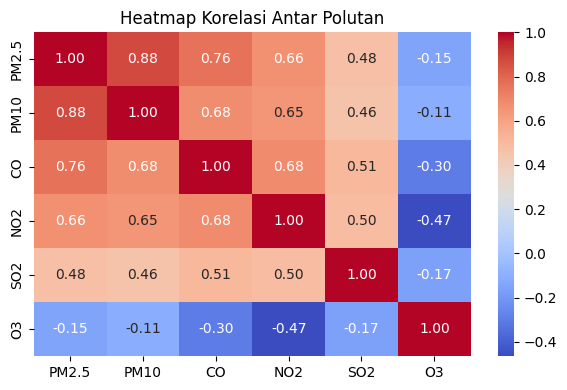

In [48]:
# --- 1. Pilih hanya kolom numerik yang relevan ---
df_corr = all_data_df[['PM2.5', 'PM10', 'CO', 'NO2', 'SO2', 'O3']]

# --- 2. Hitung korelasi Pearson antar variabel ---
corr_matrix = df_corr.corr(method='pearson')

# --- 3. Visualisasi korelasi dengan heatmap ---
plt.figure(figsize=(6, 4))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Heatmap Korelasi Antar Polutan')
plt.tight_layout()
plt.show()

**Insight**

- Hubungan yang Sangat Erat:
  - PM2.5 dan PM10 memiliki korelasi sangat tinggi (0.88) → menandakan bahwa ketika konsentrasi PM10 meningkat, PM2.5 juga cenderung meningkat secara bersamaan.
  - PM2.5 dan CO juga memiliki korelasi tinggi (0.76) → karbon monoksida sangat mungkin berkontribusi dalam peningkatan partikel halus.

- Hubungan Sedang:
  - PM2.5 dengan NO2 (0.66) dan SO2 (0.48) → masih cukup kuat untuk dianggap relevan dalam analisis kualitas udara.
  - CO juga berkorelasi sedang dengan NO2 (0.68) dan SO2 (0.51).

- Hubungan Negatif:
  - O3 (ozon) menunjukkan korelasi negatif terhadap hampir semua polutan lain
  - ozon cenderung tinggi ketika polutan lain rendah, yang bisa terjadi saat cuaca cerah (fotokimia aktif, emisi kendaraan rendah, dll).

### Explore ...

## Visualization & Explanatory Analysis

- Tahapan ini menyajikan data dalam bentuk visual seperti grafik dan diagram untuk menunjukkan pola, tren, dan hubungan antar variabel secara jelas dan informatif.
- Tujuannya Untuk membantu menjawab pertanyaan bisnis melalui visualisasi yang memudahkan pemahaman, mendukung pengambilan keputusan, dan menjelaskan temuan penting dalam data.

### Pertanyaan 1:

**Bagaimana tren tingkat polusi udara (PM2.5) di berbagai lokasi dari waktu ke waktu?**

**Penjelasan: Alasan Memilih Visualisasi Data untuk Pertanyaan Bisnis 1**

- Line Chart untuk Melihat Tren Bulanan:

  - Line chart sangat cocok digunakan untuk menganalisis tren waktu, khususnya ketika kita ingin melihat bagaimana konsentrasi PM2.5 berubah setiap bulan dari Januari hingga Desember di setiap stasiun. Line chart mampu menghubungkan titik-titik data dari waktu ke waktu, memudahkan pengguna dalam melihat fluktuasi bulanan secara visual dan mendeteksi tren kenaikan atau penurunan secara terus-menerus.

- Bar Chart untuk Perbandingan Tingkat Polusi Antar Stasiun:

  - Bar chart cocok digunakan untuk membandingkan nilai di antara beberapa kategori (dalam hal ini, antar stasiun), terutama jika kita ingin membandingkan rata-rata tahunan PM2.5 di berbagai stasiun. Bar chart memudahkan pengguna untuk melihat perbandingan langsung antara stasiun-stasiun yang berbeda dalam tahun yang sama, sehingga pengguna bisa langsung mengidentifikasi stasiun mana yang memiliki tingkat polusi udara tertinggi dan terendah.

#### Line Chart - Tren Bulanan PM2.5 per Stasiun dari Tahun ke Tahun

In [49]:
# Daftar polutan yang ingin dianalisis
pollutants = ['PM2.5']

# Menghitung rata-rata polutan per bulan dan tahun per stasiun
df_yearly_gas = all_data_df.groupby(['station', 'year', 'month'])[pollutants].mean().reset_index()

# Menetapkan label bulan
month_label = ['Jan', 'Feb', 'Mar', 'Apr', 'Mei', 'Jun', 'Jul', 'Agu', 'Sep', 'Okt', 'Nov', 'Des']

# Membuat fungsi untuk memplot data per stasiun
def plot_pm25_trend(station):
    # Mengatur jumlah tahun yang akan dianalisis
    years = range(2013, 2017 + 1)

    # Mengatur ukuran plot
    plt.figure(figsize=(20, 4))

    # Looping melalui setiap tahun dan buat subplot
    for i, year in enumerate(years):
        # Menyaring data untuk stasiun dan tahun tertentu
        station_data = df_yearly_gas[(df_yearly_gas['station'] == station) & (df_yearly_gas['year'] == year)]

        # Membuat subplot
        plt.subplot(1, len(years), i + 1)

        # Membuat lineplot untuk PM2.5 per bulan
        sns.set(style="whitegrid")
        sns.lineplot(x='month', y='PM2.5', data=station_data, marker='s', color='royalblue')  # Marker kotak warna biru

        # Menyesuaikan plot
        plt.title(f'Tahun {year}', fontsize=10)
        plt.xlabel('Bulan', fontsize=8)
        plt.ylabel('PM2.5 (µg/m³)', fontsize=8)
        plt.xticks(range(1, 13), month_label, rotation=45, fontsize=8)

    # Menyesuaikan layout agar subplot tidak tumpang tindih
    plt.tight_layout()

    # Menampilkan plot
    plt.suptitle(f'Tren Bulanan PM2.5 di Stasiun {station} (2013-2017)', y=1.02, fontsize=12)
    plt.show()

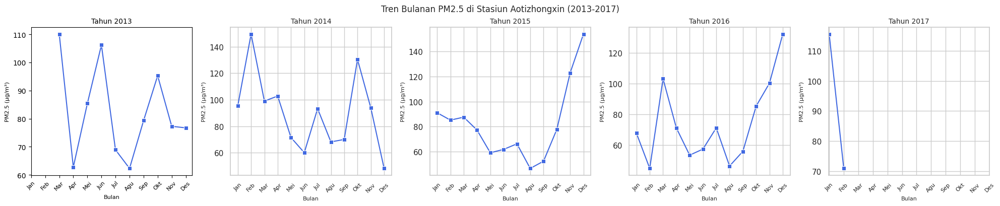

In [50]:
# Plot untuk Stasiun Aotizhongxin
plot_pm25_trend('Aotizhongxin')

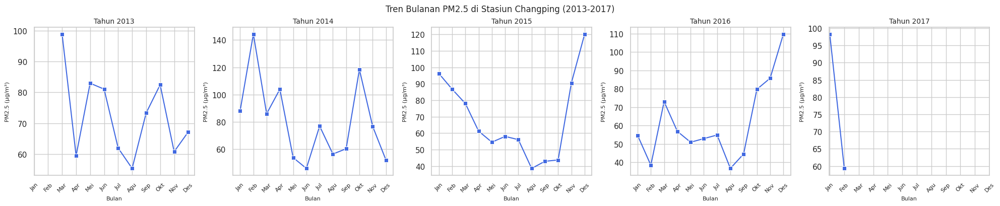

In [51]:
# Plot untuk Stasiun Changping
plot_pm25_trend('Changping')

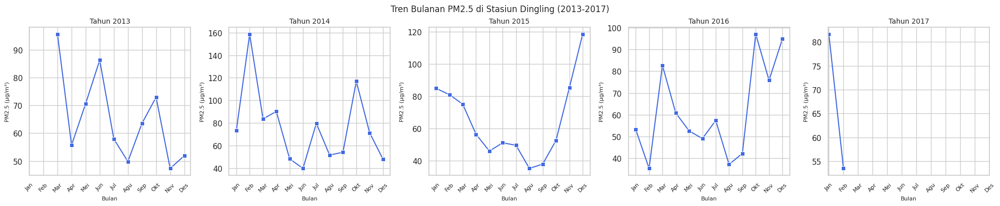

In [52]:
# Plot untuk Stasiun Dingling
plot_pm25_trend('Dingling')

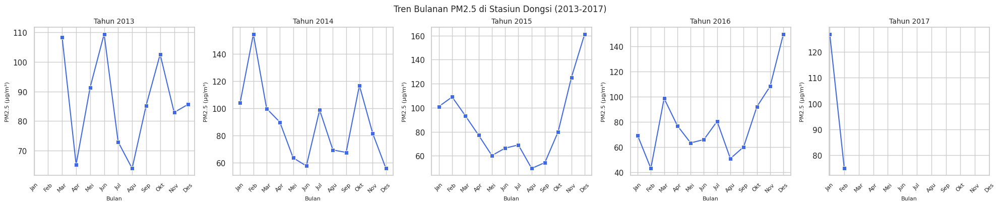

In [53]:
# Plot untuk Stasiun Dongsi
plot_pm25_trend('Dongsi')

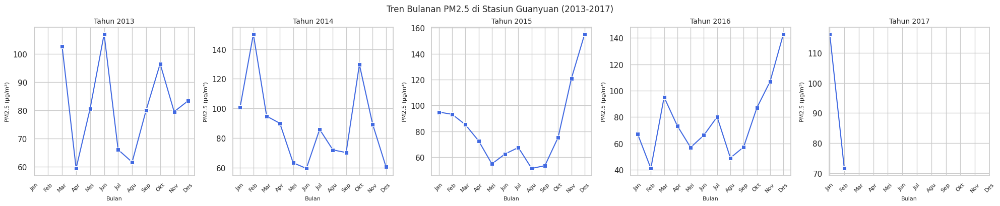

In [54]:
# Plot untuk Stasiun Guangyuan
plot_pm25_trend('Guanyuan')

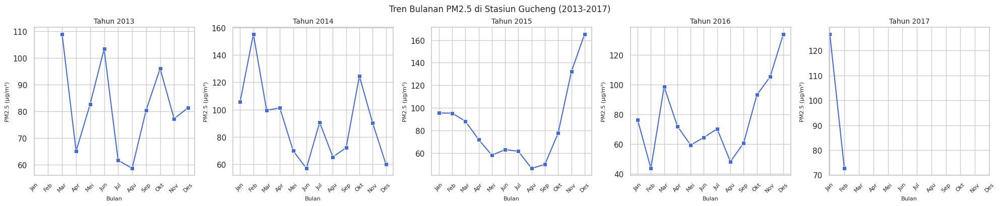

In [55]:
# Plot untuk Stasiun Gucheng
plot_pm25_trend('Gucheng')

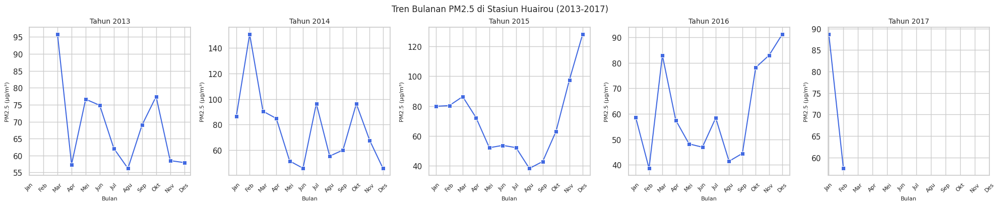

In [56]:
# Plot untuk Stasiun Huairou
plot_pm25_trend('Huairou')

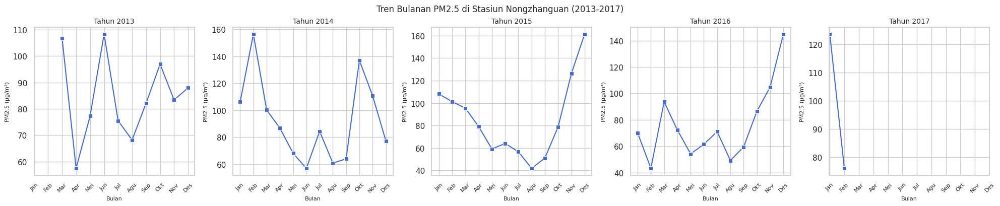

In [57]:
# Plot untuk Stasiun Nongzhanguan
plot_pm25_trend('Nongzhanguan')

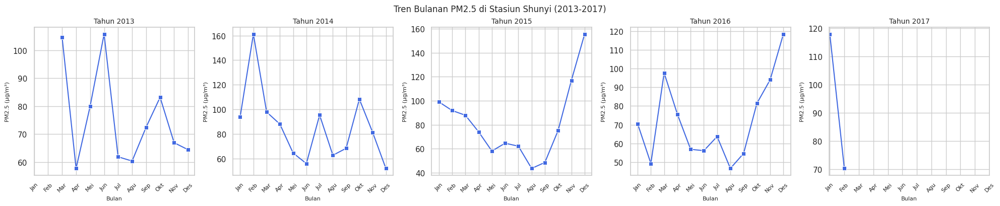

In [58]:
# Plot untuk Stasiun Shunyi
plot_pm25_trend('Shunyi')

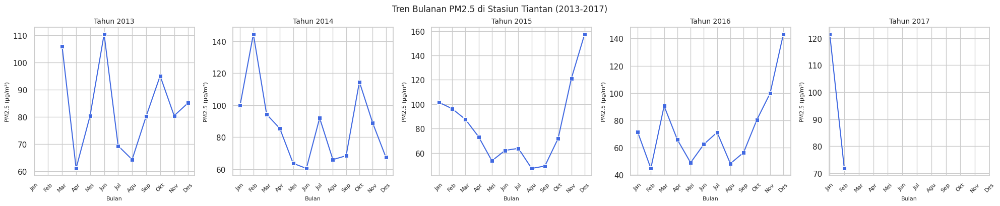

In [59]:
# Plot untuk Stasiun Tiantan
plot_pm25_trend('Tiantan')

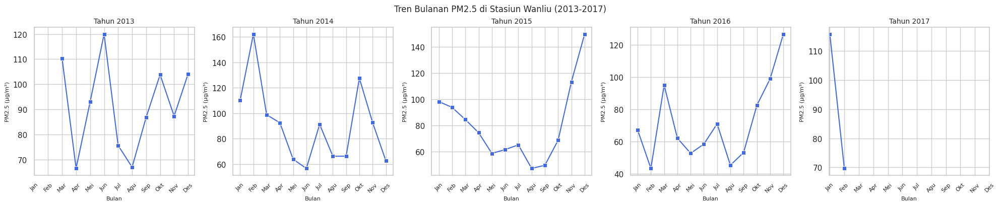

In [60]:
# Plot untuk Stasiun Wanliu
plot_pm25_trend('Wanliu')

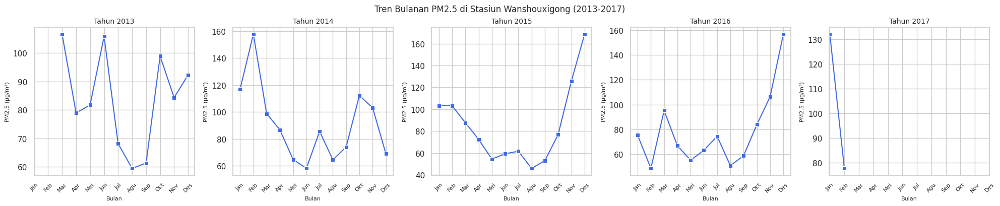

In [61]:
# Plot untuk Stasiun Wangshouxigong
plot_pm25_trend('Wanshouxigong')

**Insight:**

- Ketiga stasiun menunjukkan **pola tren yang hampir identik**

  - 2013: Pola musiman terlihat jelas — kadar PM2.5 tinggi pada (Maret dan Juni), serta rendah di pertengahan tahun (Juli–September).

  - 2014: PM2.5 justru lebih rendah dibanding 2013, terutama di pertengahan tahun. Lonjakan tinggi hanya terjadi di bulan Februari

  - 2015: Lonjakan ekstrem di Desember, melebihi 160 μg/m³. Ini merupakan puncak tertinggi selama periode 5 tahun.

  - 2016: PM2.5 kembali menurun dari 2015. Namun, pola musiman tetap konsisten — naik di akhir tahun.

  - 2017: Data terbatas (Januari–Februari), tapi tetap menunjukkan kadar tinggi di awal tahun.

#### Bar Chart - Rata-Rata PM2.5 Antar Stasiun

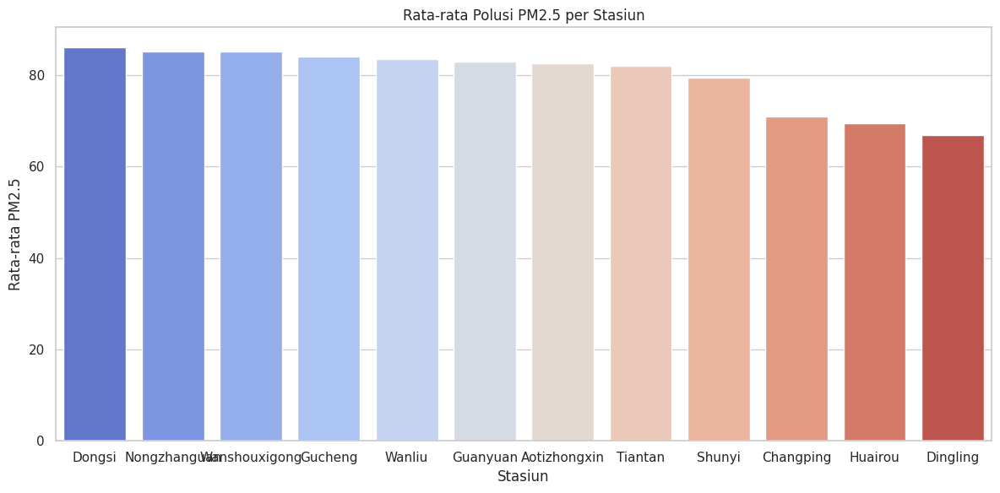

In [62]:
# Menghitung rata-rata PM2.5 per stasiun
pm25_mean_per_station = all_data_df.groupby('station')['PM2.5'].mean()

# Menyusun stasiun dari yang tertinggi ke terendah
sorted_stations = pm25_mean_per_station.sort_values(ascending=False)

# Mengatur ukuran dan gaya plot
plt.figure(figsize=(12, 6))
sns.set(style="whitegrid")

# Membuat subplot untuk visualisasi
sns.barplot(x=sorted_stations.index, y=sorted_stations.values, palette="coolwarm")
plt.title('Rata-rata Polusi PM2.5 per Stasiun')
plt.xlabel('Stasiun')
plt.ylabel('Rata-rata PM2.5')

# Menyesuaikan layout agar tidak ada yang terpotong
plt.tight_layout()
plt.show()


**Insight:**
- Stasiun Tertinggi
  - Stasiun dengan polusi PM2.5 tertinggi adalah Stasiun Dongsi.
  - Dari 3 Stasiun tertinggi  memiliki rata-rata konsentrasi PM2.5 di atas 80 µg/m³, yang menunjukkan tingkat polusi udara yang cukup tinggi.

- Stasiun Terendah
  - Stasiun dengan polusi PM2.5 terendah adalah Stasiun Dingling
  - Dari 3 Stasiun terendah memiliki konsentrasi PM2.5 di bawah 80 µg/m³, yang menunjukan tingkat polusi sedikit lebih rendah dari stasiun lainnya

### Pertanyaan 2:

**Bagaimana hubungan antara PM2.5 dengan CO, NO₂, dan SO₂ di berbagai stasiun tahun 2013–2017, dan polutan mana yang paling berkorelasi?**

**Penjelasan: Alasan Memilih Visualisasi Data untuk Pertanyaan Bisnis 2**
- Scatter Plot untuk Melihat Hubungan Antar Polutan:
  - Scatter plot sangat sesuai digunakan untuk mengevaluasi hubungan antara dua variabel numerik, seperti PM2.5 terhadap CO, NO2, dan SO2. Dengan scatter plot, kita dapat melihat apakah terdapat pola hubungan yang konsisten di antara polutan-polutan tersebut.
  - Visualisasi ini memungkinkan pengguna untuk mengamati pola sebaran data, kekuatan hubungan, serta keberadaan outlier yang mungkin memengaruhi analisis.

- Bar Chart untuk Perbandingan Nilai Korelasi:
  - Bar chart cocok digunakan untuk membandingkan nilai korelasi antar variabel di beberapa kategori (dalam hal ini, antar stasiun).
  - Visualisasi ini digunakan untuk melihat seberapa kuat hubungan antara PM2.5 dengan polutan lain seperti CO, NO2, dan SO2 di tiap stasiun pemantauan dan dapat memudahkan dalam mengamati dan membandingkan kekuatan hubungan di berbagai stasiun secara langsung pada tahaun tertentu.

#### Scatter Plot - Melihat Hubungan Antar Polutan

In [63]:
def plot_pm25_scatter_polutans(station):
    df_station = all_data_df[all_data_df['station'] == station].copy()

    # Buat kolom 'date' dan 'year' jika belum ada
    if 'date' not in df_station.columns and {'year', 'month', 'day'}.issubset(df_station.columns):
        df_station['date'] = pd.to_datetime(df_station[['year', 'month', 'day']], errors='coerce')
    if 'year' not in df_station.columns:
        df_station['year'] = df_station['date'].dt.year

    years = [2013, 2014, 2015, 2016, 2017]
    polutans = ['CO', 'NO2', 'SO2']
    colors = ['#66c2a5', '#fc8d62', '#8da0cb']
    line_colors = ['#82E0AA', '#F1948A', '#5DADE2']

    fig, ax = plt.subplots(len(polutans), len(years), figsize=(22, 10))
    sns.set(style="whitegrid")
    fig.suptitle(f'Hubungan PM2.5 dengan CO, NO2, dan SO2 di {station} (2013–2017)', fontsize=16, y=1.03)

    for row, polutan in enumerate(polutans):
        for col, year in enumerate(years):
            df_year = df_station[df_station['year'] == year]

            if polutan in df_year.columns and 'PM2.5' in df_year.columns:
                df_filtered = df_year[[polutan, 'PM2.5']].dropna()

                if not df_filtered.empty and len(df_filtered) > 10:
                    sns.regplot(
                        x=polutan, y='PM2.5',
                        data=df_filtered,
                        ax=ax[row, col],
                        scatter_kws={'alpha': 0.3, 's': 15},
                        line_kws={'color': line_colors[row]},
                        color=colors[row],
                        ci=95
                    )
                    ax[row, col].set_ylim(0, df_filtered['PM2.5'].max() + 50)
                    ax[row, col].set_title(f"{polutan} vs PM2.5 ({year})", fontsize=9)
                    ax[row, col].set_xlabel(polutan)
                    if col == 0:
                        ax[row, col].set_ylabel("PM2.5 (µg/m³)")
                    else:
                        ax[row, col].set_ylabel("")
                else:
                    ax[row, col].text(0.5, 0.5, "Data tidak cukup", ha='center', va='center')
                    ax[row, col].set_axis_off()

    plt.tight_layout(rect=[0, 0.03, 1, 0.97])
    plt.show()


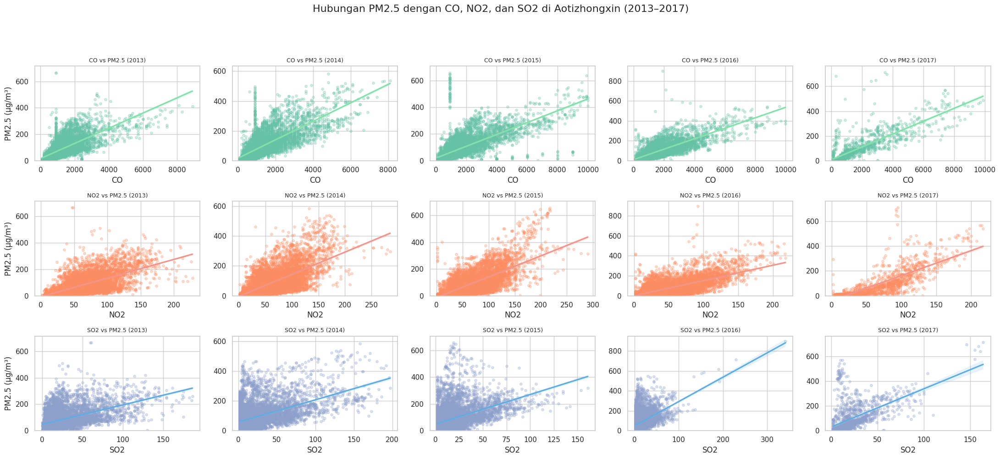

In [64]:
plot_pm25_scatter_polutans(station='Aotizhongxin')

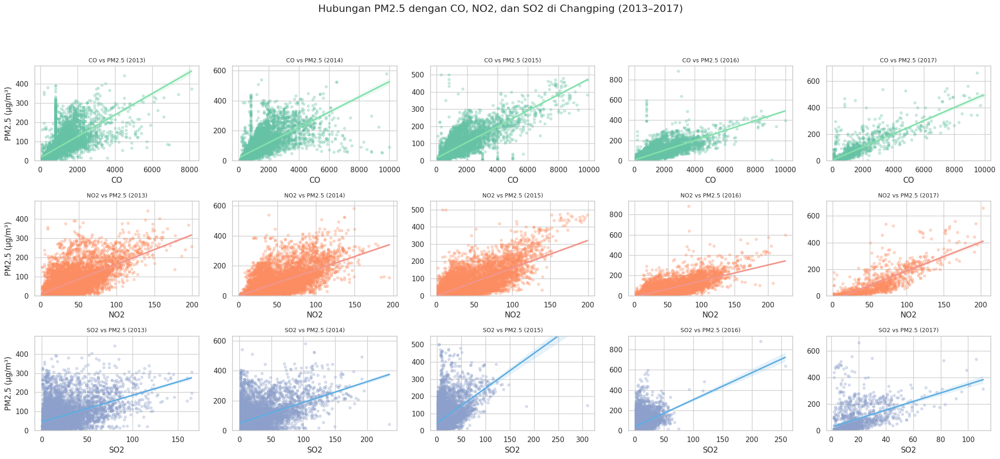

In [65]:
plot_pm25_scatter_polutans(station='Changping')

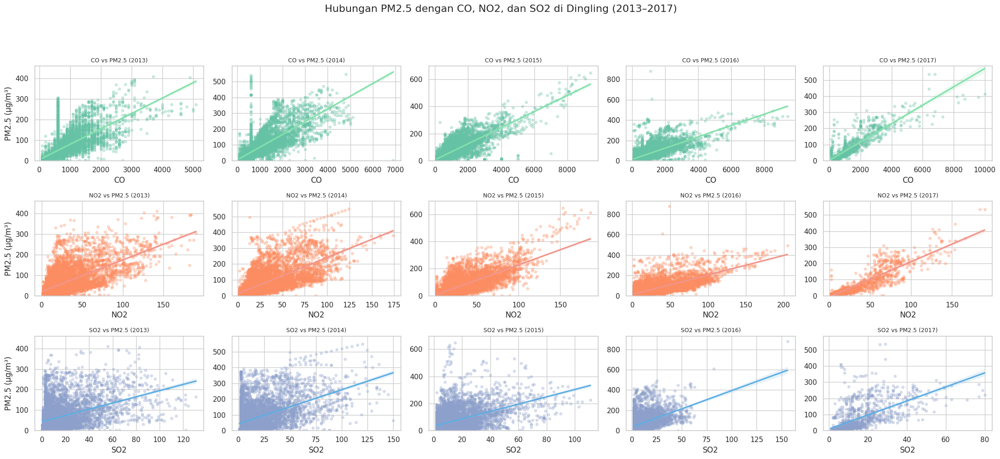

In [66]:
plot_pm25_scatter_polutans(station='Dingling')

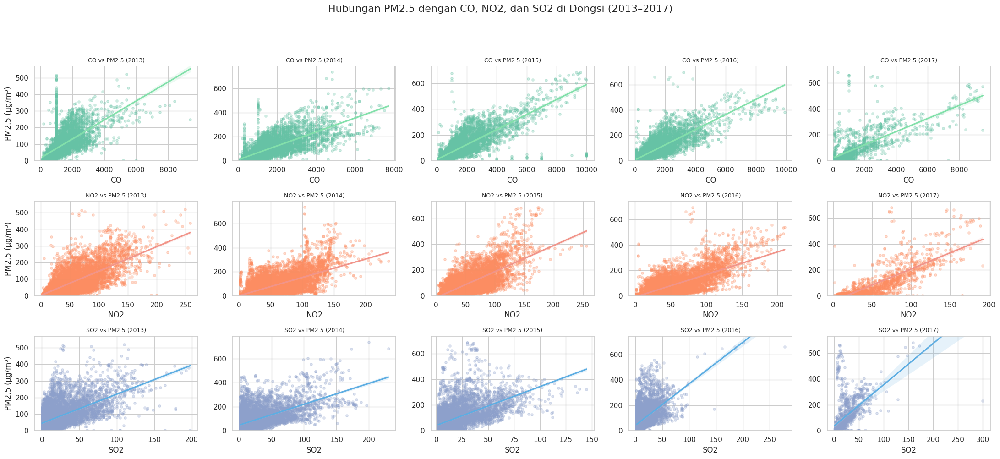

In [67]:
plot_pm25_scatter_polutans(station='Dongsi')

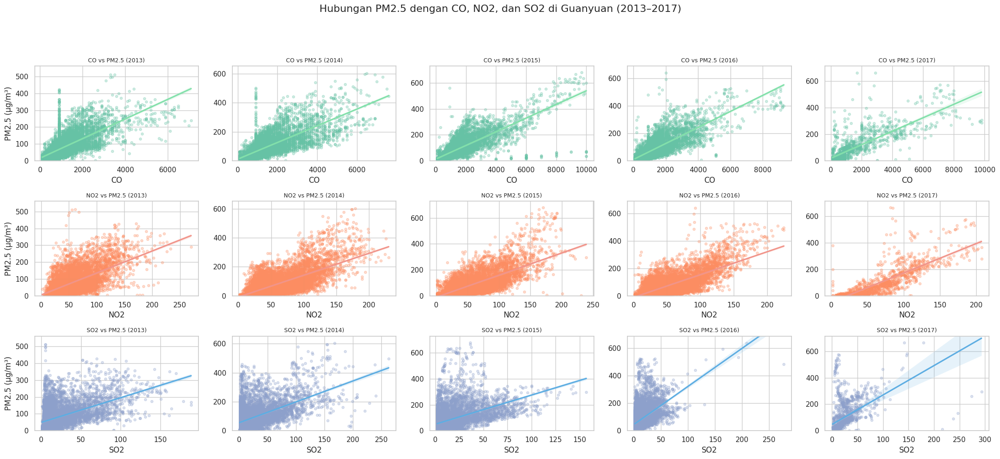

In [68]:
plot_pm25_scatter_polutans(station='Guanyuan')

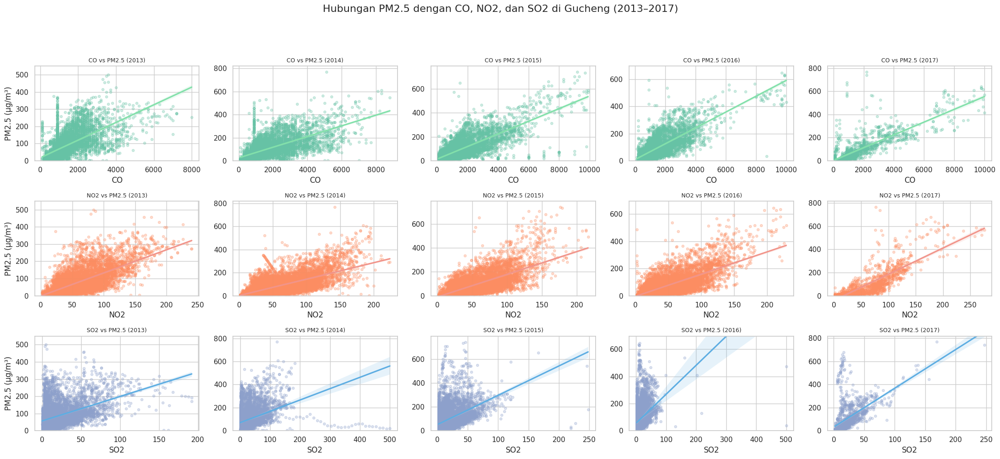

In [69]:
plot_pm25_scatter_polutans(station='Gucheng')

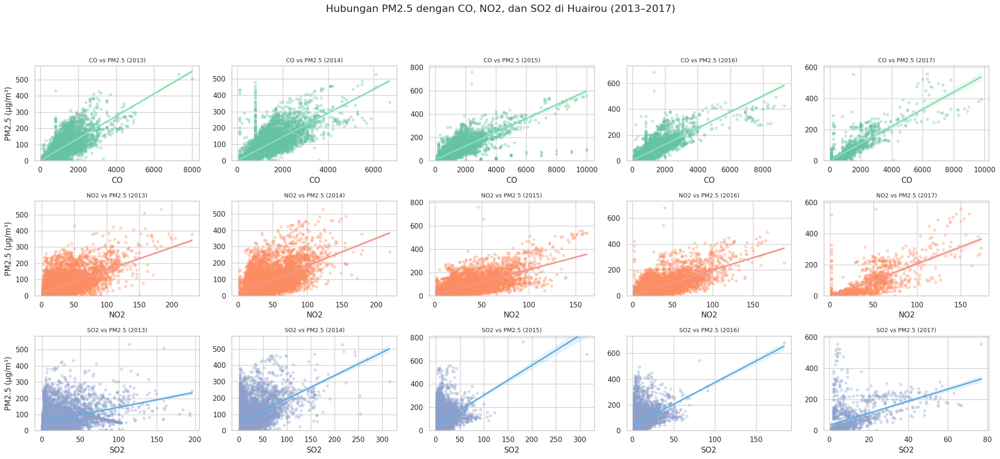

In [70]:
plot_pm25_scatter_polutans(station='Huairou')

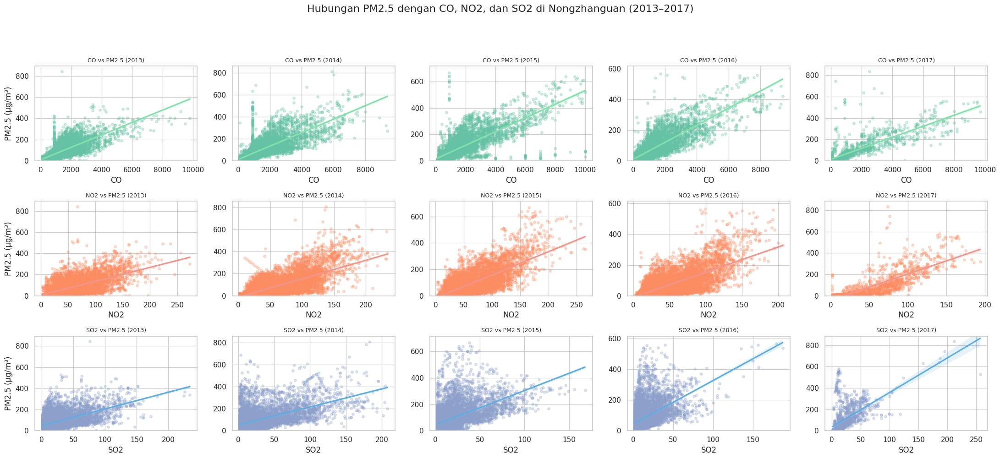

In [71]:
plot_pm25_scatter_polutans(station='Nongzhanguan')

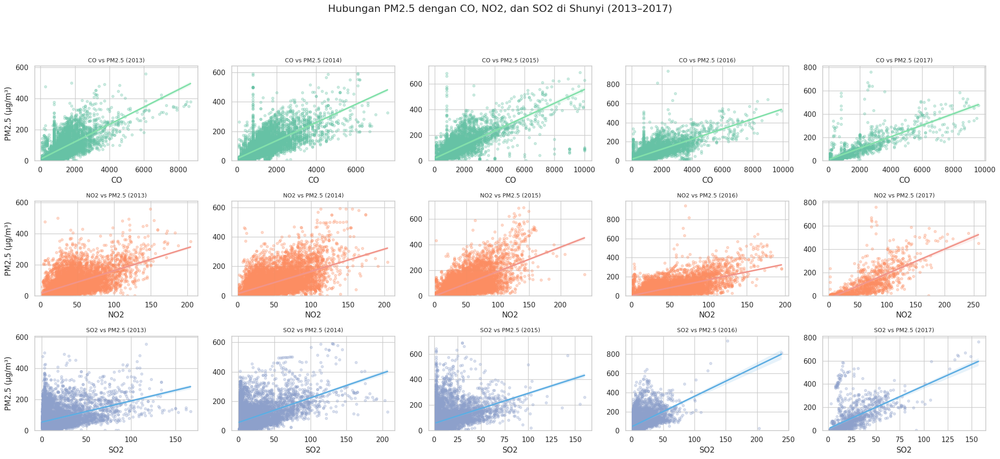

In [72]:
plot_pm25_scatter_polutans(station='Shunyi')

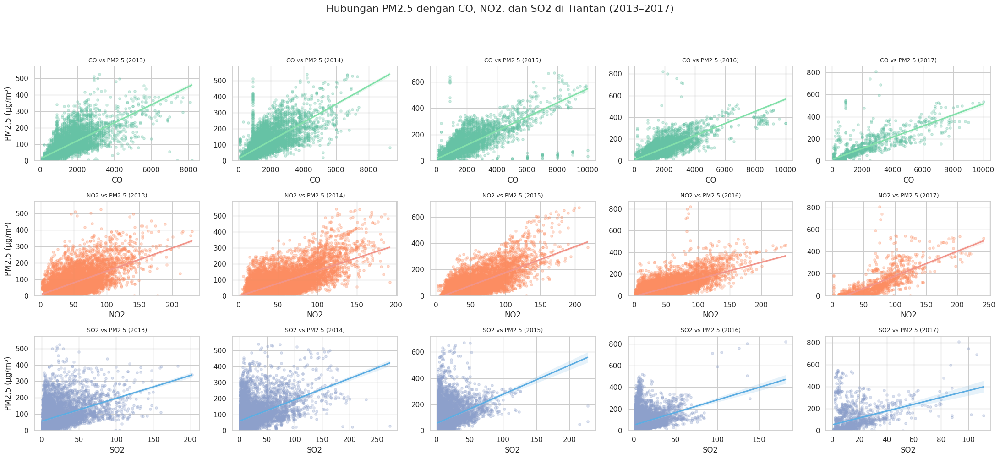

In [73]:
plot_pm25_scatter_polutans(station='Tiantan')

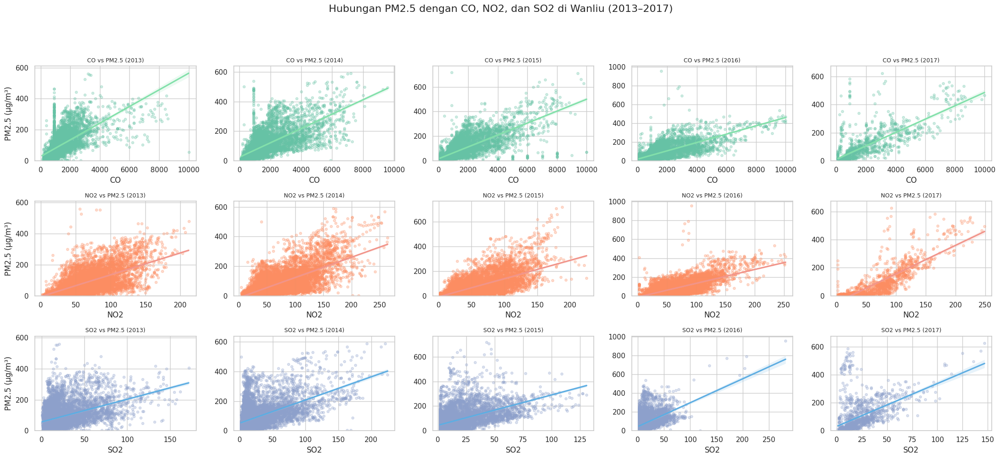

In [74]:
plot_pm25_scatter_polutans(station='Wanliu')

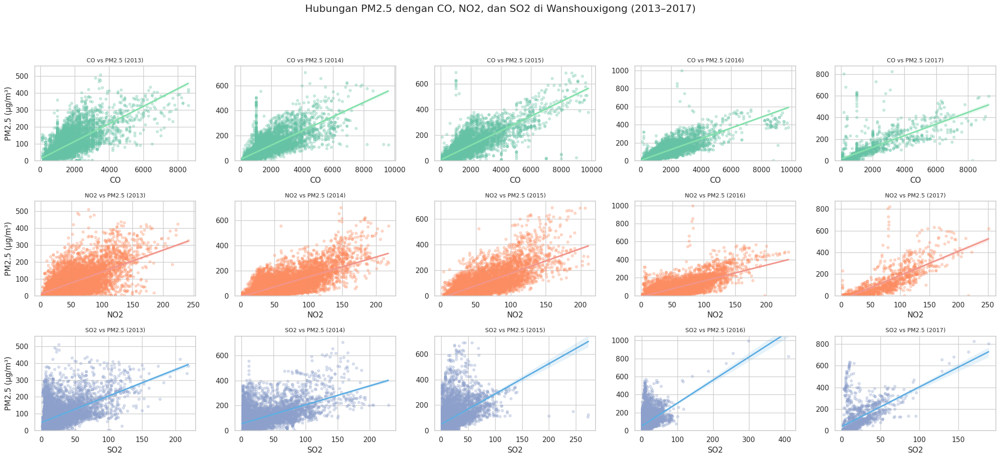

In [75]:
plot_pm25_scatter_polutans(station='Wanshouxigong')

#### Bar Chart - Perbandingan Nilai Korelasi Antar Polutan

In [76]:
def plot_bar_correlation_pm25_polutants(station_name):
    df_station = all_data_df[all_data_df['station'] == station_name].copy()

    if 'date' not in df_station.columns:
        df_station['date'] = pd.to_datetime(df_station[['year', 'month', 'day']], errors='coerce')
    if 'year' not in df_station.columns:
        df_station['year'] = df_station['date'].dt.year

    variables = ['PM2.5', 'CO', 'NO2', 'SO2']
    years = sorted(df_station['year'].dropna().unique())

    correlation_data = []

    for year in years:
        df_year = df_station[df_station['year'] == year][variables].dropna()
        if df_year.empty:
            continue

        corr_matrix = df_year.corr()
        for polutan in ['CO', 'NO2', 'SO2']:
            correlation = corr_matrix.loc['PM2.5', polutan]
            correlation_data.append({
                'Tahun': year,
                'Polutan': polutan,
                'Korelasi dengan PM2.5': max(correlation, 0)
            })

    corr_df = pd.DataFrame(correlation_data)

    plt.figure(figsize=(10, 6))
    ax = sns.barplot(
        data=corr_df,
        x='Tahun',
        y='Korelasi dengan PM2.5',
        hue='Polutan',
        palette='Set2'
    )

    # Tambahkan label angka korelasi di atas batang
    for container in ax.containers:
        ax.bar_label(container, fmt='%.2f', label_type='edge', padding=2, fontsize=9)

    plt.title(f"Korelasi PM2.5 dengan CO, NO2, SO2 di {station_name} (2013–2017)")
    plt.ylim(0, 1)
    plt.axhline(0, color='gray', linestyle='--')
    plt.ylabel("Nilai Korelasi")
    plt.tight_layout()
    plt.legend(title='Polutan')
    plt.show()


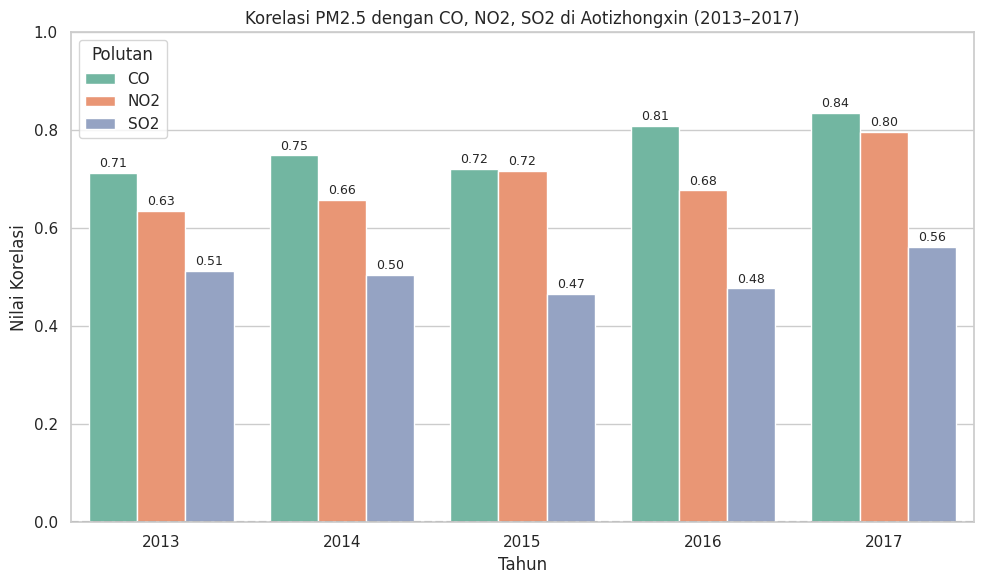

In [77]:
plot_bar_correlation_pm25_polutants('Aotizhongxin')

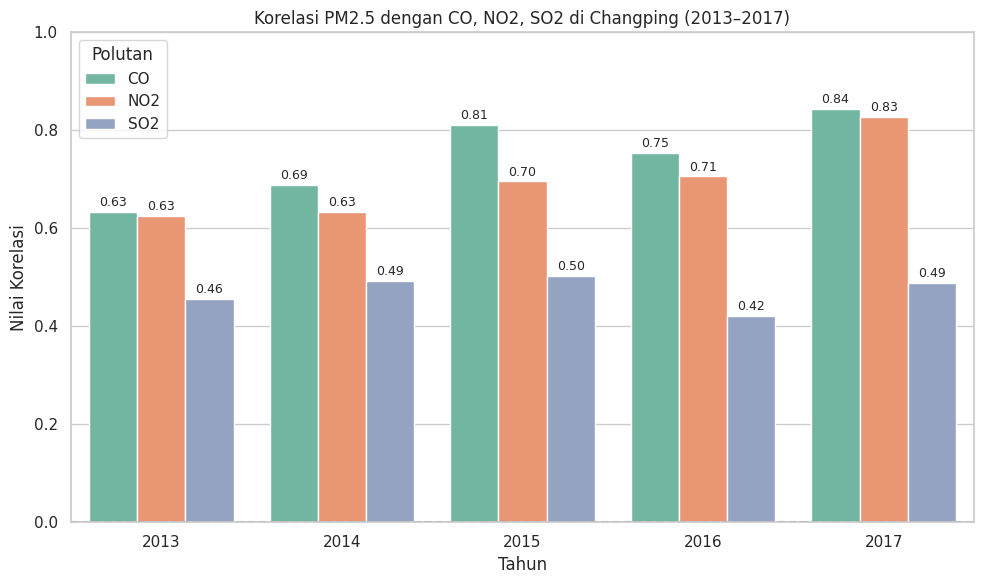

In [78]:
plot_bar_correlation_pm25_polutants('Changping')

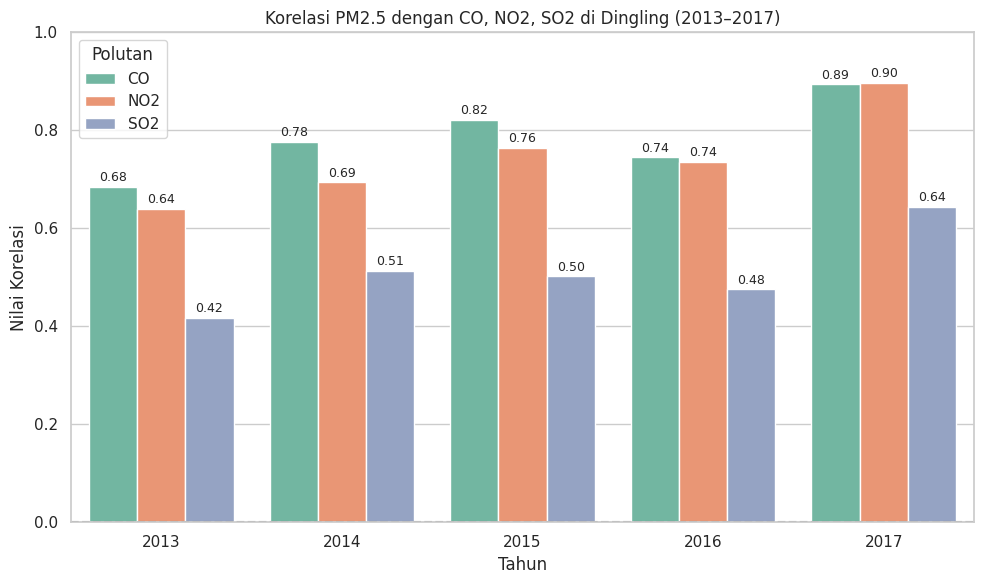

In [79]:
plot_bar_correlation_pm25_polutants('Dingling')

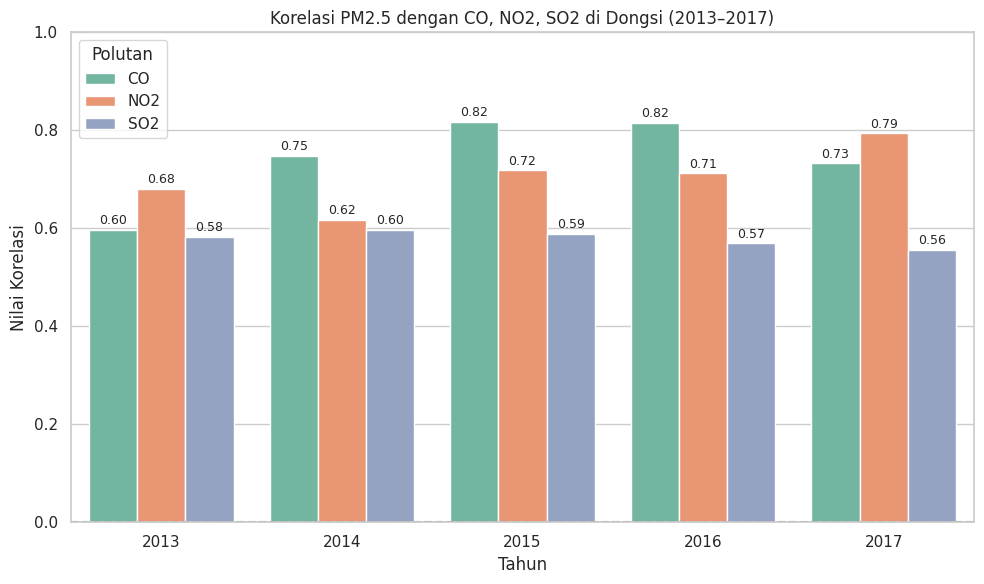

In [80]:
plot_bar_correlation_pm25_polutants('Dongsi')

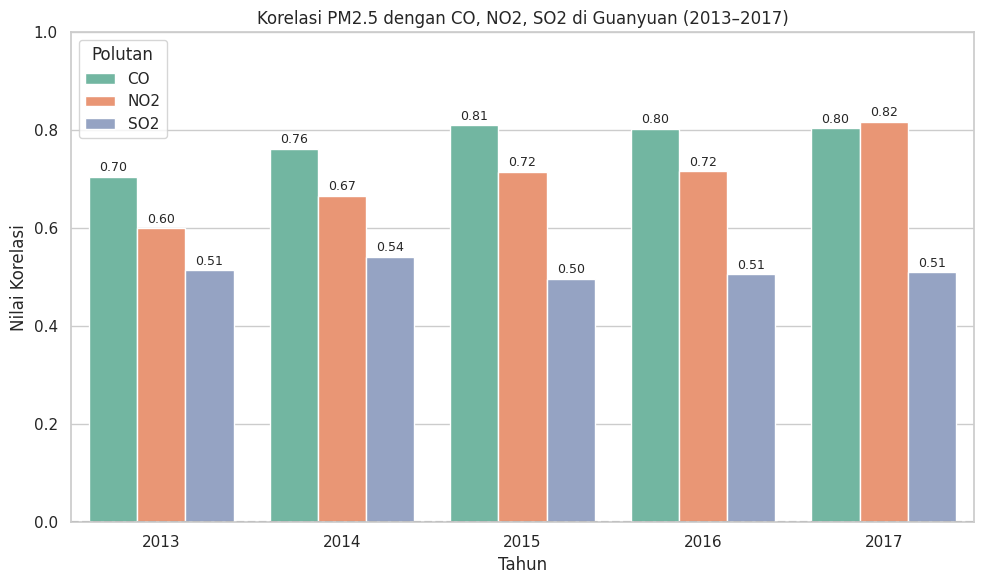

In [81]:
plot_bar_correlation_pm25_polutants('Guanyuan')

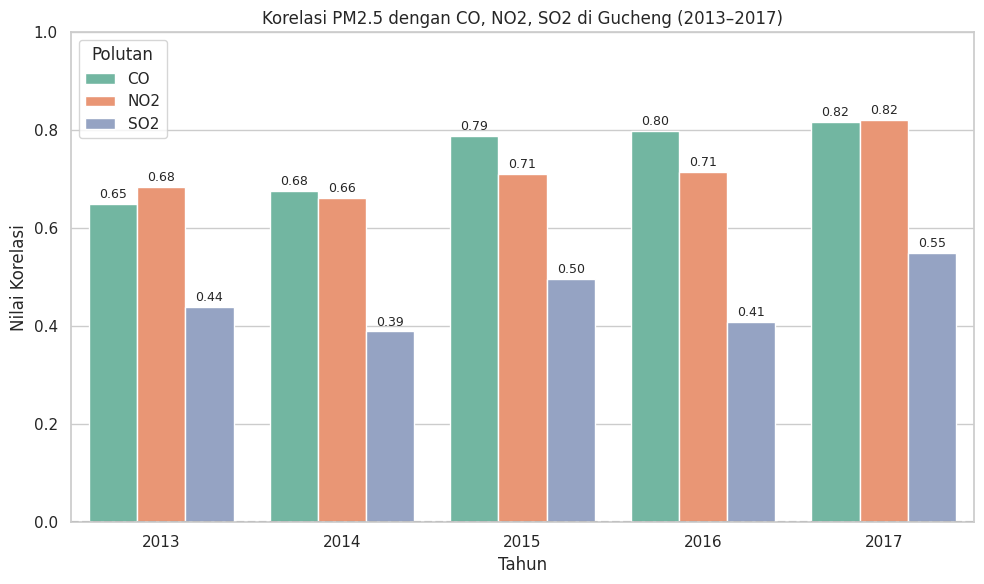

In [82]:
plot_bar_correlation_pm25_polutants('Gucheng')

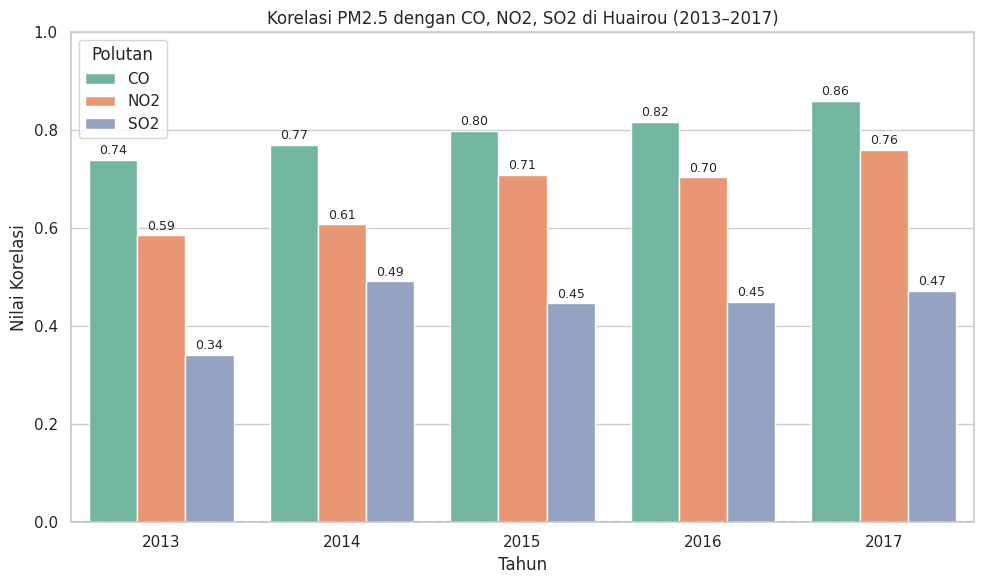

In [83]:
plot_bar_correlation_pm25_polutants('Huairou')

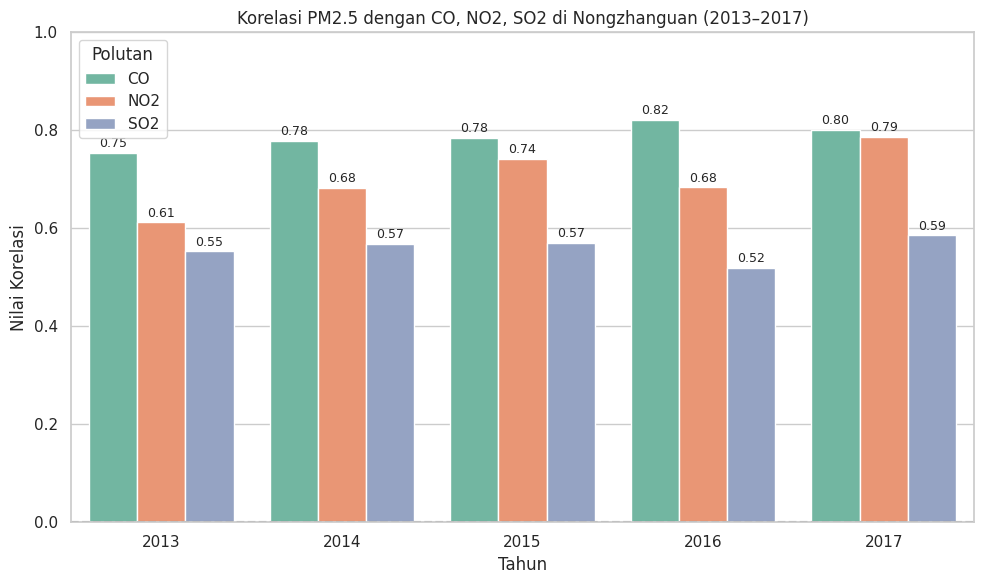

In [84]:
plot_bar_correlation_pm25_polutants('Nongzhanguan')

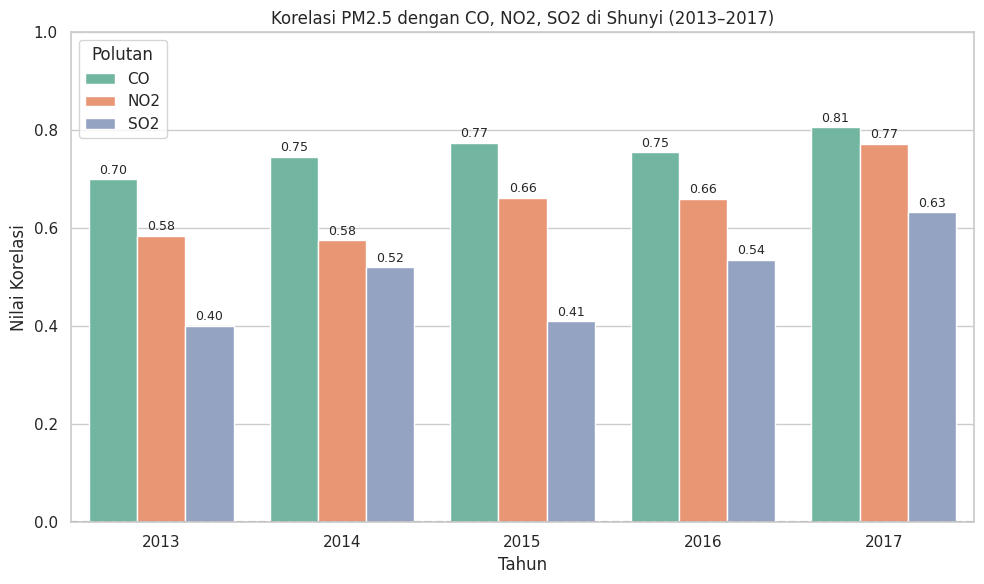

In [85]:
plot_bar_correlation_pm25_polutants('Shunyi')

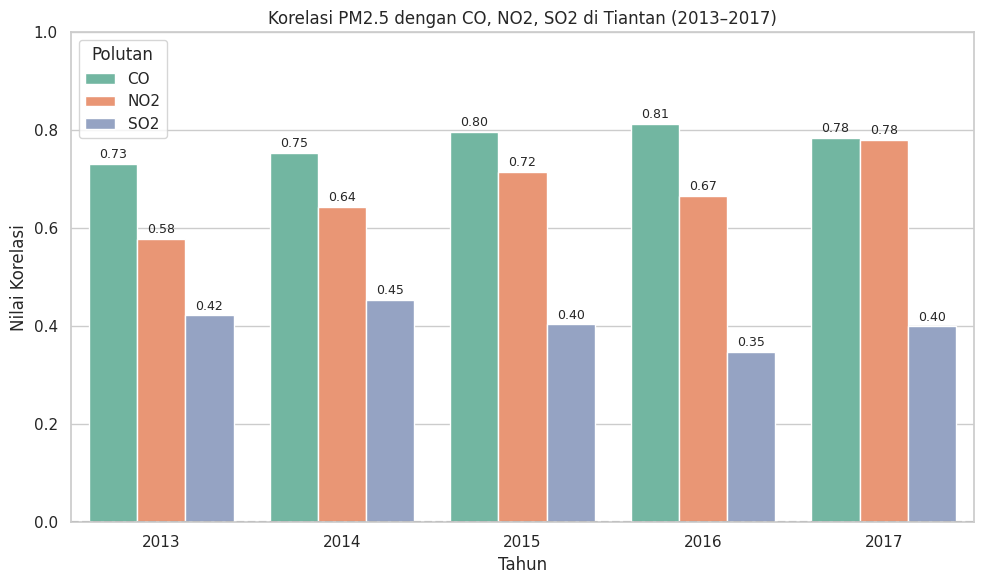

In [86]:
plot_bar_correlation_pm25_polutants('Tiantan')

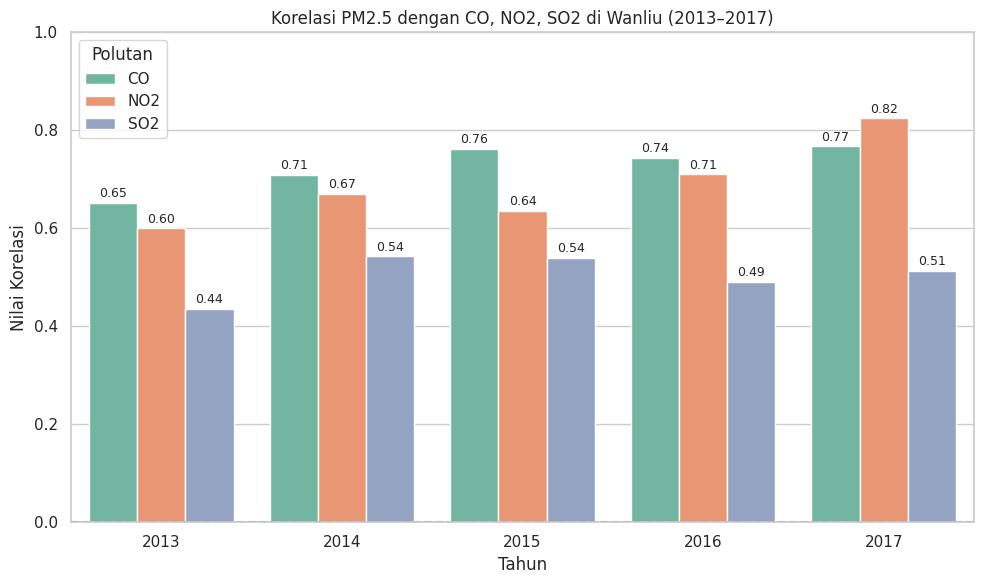

In [87]:
plot_bar_correlation_pm25_polutants('Wanliu')

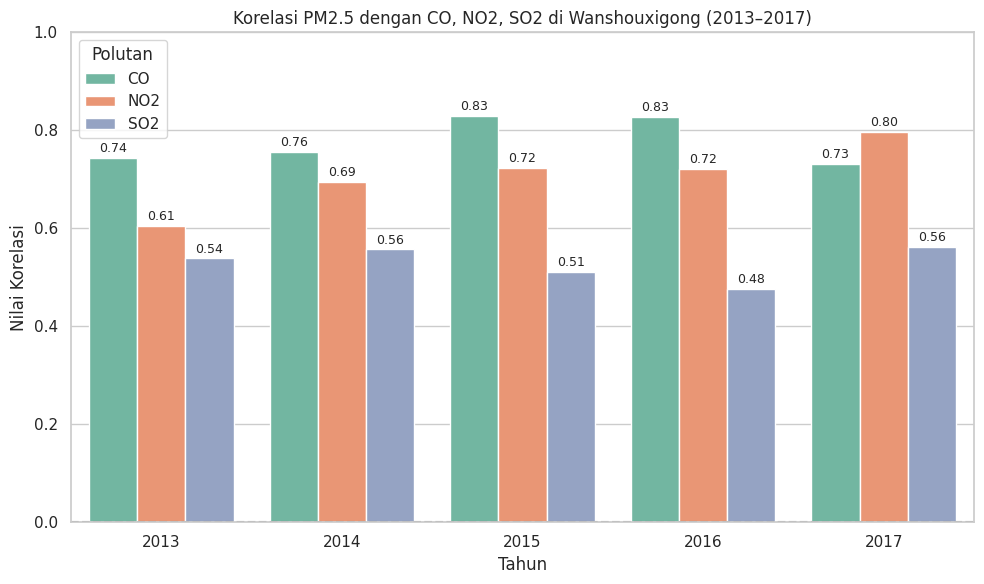

In [88]:
plot_bar_correlation_pm25_polutants('Wanshouxigong')

**Insight:**
- CO dan NO₂ adalah dua polutan yang paling konsisten dan kuat korelasinya dengan PM2.5 di hampir semua stasiun.
- SO₂ cenderung menurun korelasinya dari tahun ke tahun dan merupakan polutan yang paling lemah hubungannya dengan PM2.5.
- Korelasi terkuat terlihat di stasiun Wanshouxigong, Nongzhanguan, dan Aotizhongxin.
- Stasiun dengan korelasi terlemah: Huairou — kemungkinan karena lokasi lebih jauh dari pusat kota (suburban/rural).

## Analisis Lanjutan (Opsional)

### Pertanyaan 3:

**Bagaimana pola spasial konsentrasi PM2.5 berdasarkan musim di seluruh stasiun di Beijing?**

**Penjelasan: Alasan Memilih Visualisasi Data untuk Pertanyaan Bisnis 3**
- Peta Interaktif Folium untuk Analisis Spasial:
  - Peta interaktif berbasis folium sangat tepat digunakan untuk menunjukkan persebaran spasial kualitas udara di berbagai stasiun dan musim
  - Dengan menampilkan rata-rata konsentrasi PM2.5 atau kategori polusi udara pada tiap titik lokasi, pengguna dapat mengidentifikasi wilayah dengan tingkat polusi tinggi secara geografis.

- Bar Chart Distribusi Kategori PM2.5 per Musim:
  - Bar chart digunakan untuk menganalisis seberapa sering setiap kategori kualitas udara (Rendah, Sedang, Tinggi) muncul pada masing-masing musim.
  - Visualisasi ini memungkinkan pengguna memahami pola musiman polusi udara dan melihat apakah musim tertentu cenderung memiliki tingkat polusi yang lebih tinggi.



#### Geospatial Analysis

In [89]:
data_musiman = avg_pm25_season_station.copy()

# Daftar musim
musim_list = ['Musim Dingin', 'Musim Semi', 'Musim Panas', 'Musim Gugur']

# Warna untuk setiap kategori
palette_kategori = {
    'Rendah': 'green',
    'Sedang': 'orange',
    'Tinggi': 'red',
}

# Koordinat stasiun
station_locations = {
    'Aotizhongxin': [39.909, 116.397],
    'Changping': [40.218, 116.231],
    'Dingling': [40.292, 116.225],
    'Dongsi': [39.929, 116.417],
    'Guanyuan': [39.933, 116.362],
    'Gucheng': [39.914, 116.188],
    'Huairou': [40.364, 116.631],
    'Nongzhanguan': [39.933, 116.470],
    'Shunyi': [40.126, 116.655],
    'Tiantan': [39.876, 116.417],
    'Wanliu': [39.999, 116.288],
    'Wanshouxigong': [39.882, 116.340],
}

# Ikon untuk setiap musim
musim_icons = {
    'Musim Dingin': 'asterisk',
    'Musim Semi': 'leaf',
    'Musim Panas': 'sun',
    'Musim Gugur': 'tree',
}

# --- Inisialisasi Peta ---
m = folium.Map(location=[39.9042, 116.4074], zoom_start=10, tiles="CartoDB positron")

# --- Tambahkan Layer untuk Setiap Musim ---
for musim in musim_list:
    fg = folium.FeatureGroup(name=musim)

    musim_data = data_musiman[data_musiman['Musim'] == musim].copy()
    musim_data['lat'] = musim_data['station'].map(lambda x: station_locations.get(x, [None, None])[0])
    musim_data['lon'] = musim_data['station'].map(lambda x: station_locations.get(x, [None, None])[1])

    for _, row in musim_data.iterrows():
        if pd.isna(row['lat']) or pd.isna(row['lon']):
            continue

        kategori = row['Kategori_PM2.5']
        icon_color = palette_kategori.get(kategori, 'gray')
        icon_name = musim_icons.get(musim, 'info-circle')

        popup_html = f"""
        <b>Stasiun:</b> {row['station']}<br>
        <b>Musim:</b> {musim}<br>
        <b>Rata-rata PM2.5:</b> {row['PM2.5']:.2f} µg/m³<br>
        <b>Kategori:</b> {kategori}
        """

        tooltip = f"{row['station']} | {musim} | {row['PM2.5']:.1f} µg/m³"

        folium.Marker(
            location=[row['lat'], row['lon']],
            popup=folium.Popup(popup_html, max_width=250),
            tooltip=tooltip,
            icon=folium.Icon(color=icon_color, icon=icon_name, prefix='fa')
        ).add_to(fg)

    fg.add_to(m)

# --- Tambahkan Legenda ---
legend_html = '''
<div style="
    position: fixed;
    bottom: 50px; left: 50px;
    width: 240px;
    background-color: white;
    border: 2px solid grey;
    z-index: 9999;
    font-size: 16px;
    padding: 15px;
    box-shadow: 3px 3px 6px rgba(0,0,0,0.3);
    border-radius: 8px;
    line-height: 1.5;
    word-wrap: break-word;
">
    <b>Kategori PM2.5</b><br><br>
    <i class="fa fa-map-marker fa-2x" style="color:green; vertical-align: middle;"></i>&nbsp;Rendah (&lt; 65)<br><br>
    <i class="fa fa-map-marker fa-2x" style="color:orange; vertical-align: middle;"></i>&nbsp;Sedang (65–75)<br><br>
    <i class="fa fa-map-marker fa-2x" style="color:red; vertical-align: middle;"></i>&nbsp;Tinggi (&gt; 75)<br>
</div>
'''
m.get_root().html.add_child(folium.Element(legend_html))

# --- Layer Control & Radio Button Script ---
folium.LayerControl(collapsed=False).add_to(m)

m.get_root().html.add_child(folium.Element("""
<script>
window.addEventListener('load', function() {
  var checkboxes = document.querySelectorAll('.leaflet-control-layers-selector');
  checkboxes.forEach(function(cb) {
    var label = cb.nextSibling.textContent.trim();
    if (['Musim Dingin', 'Musim Semi', 'Musim Panas', 'Musim Gugur'].includes(label)) {
      cb.type = 'radio';
      cb.name = 'season';
    } else {
      cb.type = 'checkbox';
      cb.name = '';
    }
  });
});
</script>
"""))

# --- Tampilkan Peta ---
m


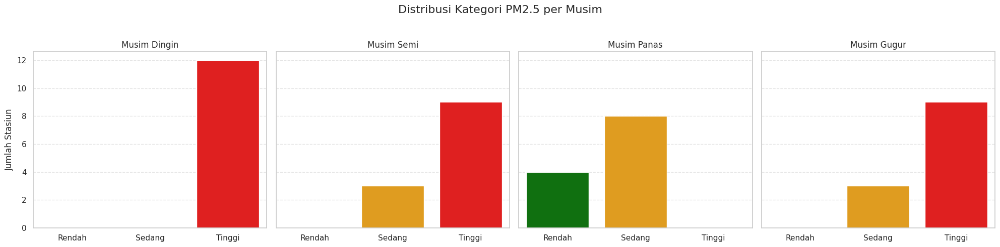

In [90]:
# Plot bar chart distribusi kategori PM2.5 per musim
fig, axes = plt.subplots(1, 4, figsize=(20, 5), sharey=True)

for i, musim in enumerate(musim_list):
    musim_df = data_musiman[data_musiman['Musim'] == musim]
    sns.countplot(
        data=musim_df,
        x='Kategori_PM2.5',
        order=['Rendah', 'Sedang', 'Tinggi'],
        palette=palette_kategori,
        ax=axes[i]
    )
    axes[i].set_title(musim)
    axes[i].set_xlabel('')
    axes[i].set_ylabel('Jumlah Stasiun' if i == 0 else '')
    axes[i].grid(axis='y', linestyle='--', alpha=0.5)

plt.suptitle("Distribusi Kategori PM2.5 per Musim", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


**Insight**
- Musim Dingin: Didominasi oleh kategori Tinggi (12 stasiun), menunjukkan musim dengan tingkat polusi paling parah.
- Musim Semi: Masih didominasi kategori Tinggi, tetapi mulai muncul stasiun dalam kategori Sedang.
- Musim Panas: Polusi menurun drastis, didominasi kategori Sedang, bahkan muncul kategori Rendah (4 stasiun).
- Musim Gugur: Kembali naik ke dominasi Tinggi, meskipun tidak seburuk musim dingin.

In [91]:
# Simpan data musiman ke file CSV
avg_pm25_season_station.to_csv("data_geospasial_pm25_musiman.csv", index=False)

In [92]:
# Simpan peta interaktif analisis geospasial PM2.5 musiman ke HTML
m.save("analisis_geospasial_pm25_musiman.html")

## Conclusion

# 📌 Kesimpulan dan Rekomendasi

**Conclution pertanyaan 1**

Selama 2013–2017, hampir semua stasiun menunjukkan pola bulanan PM2.5 yang mirip.

- Lonjakan paling tinggi tercatat di **Desember 2015** di stasiun **Dongsi**, dengan konsentrasi **lebih dari 160 μg/m³**. Kemungkinan disebabkan oleh musim dingin, di mana aktivitas pemanasan dan inversi suhu membuat polusi sulit menyebar.
- Konsentrasi terendah terjadi pada **Juli–September 2013** di **Changping**, mendekati **30 μg/m³**, kemungkinan karena curah hujan dan angin musim panas yang membantu membersihkan udara.
- Stasiun **Dongsi, Nongzhanguan, dan Wanshouxigong** mencatat rata-rata tertinggi karena berada di pusat kota yang padat aktivitas dan lalu lintas.
- Stasiun **Huairou, Changping, dan Dingling** konsisten memiliki nilai terendah, karena letaknya di pinggiran kota dengan vegetasi dan sirkulasi udara lebih baik.

**Saran/Rekomendasi**
- Pemerintah bisa fokuskan pengendalian emisi pada **bulan-bulan akhir tahun**, terutama di wilayah seperti Dongsi.
- Stasiun dengan polusi tinggi seperti Dongsi sebaiknya jadi prioritas untuk monitoring intensif dan pembatasan kendaraan.
- Jadikan area seperti Huairou dan Changping sebagai **contoh wilayah hijau** untuk dikembangkan lebih lanjut.

---


**Conclution pertanyaan 2**

- **NO₂** menunjukkan hubungan paling kuat terhadap PM2.5, dengan korelasi lebih dari 0.75 di beberapa tahun, kemungkinan karena keduanya berasal dari kendaraan bermotor dan aktivitas pembakaran.
- **SO₂** punya korelasi paling lemah dan dan korelasinya terus menurun tiap tahun. Hal ini bisa jadi karena adanya perbaikan di sektor industri, seperti pengurangan penggunaan batu bara atau peningkatan efisiensi pembangkit.

**Saran/Rekomemdasi:**
- Prioritaskan pengendalian **NO₂**, misalnya dengan pengembangan transportasi publik dan kendaraan listrik.
- Lanjutkan pengawasan pada **sektor industri** agar tren penurunan SO₂ tetap terjaga.

---


**Conclution pertanyaan 3**

- **Musim dingin dan semi (Des–Mei)** memiliki kadar PM2.5 tertinggi, dengan banyak stasiun mencatat nilai di atas **150 μg/m³**. hal ini mungkin karena kondisi cuaca yang membuat polusi terjebak dan aktivitas pembakaran meningkat.
- **Musim panas (Jun–Agu)** mencatat kualitas udara terbaik (sekitar **30–60 μg/m³**) karena dukungan hujan dan angin.
- **Musim gugur (Sep–Nov)** berada di tengah, mulai menunjukkan peningkatan kadar polusi.

**Saran/Rekomendasi:**
- Tingkatkan **sosialisasi dan pengawasan saat musim dingin**, karena dampaknya tinggi terhadap kesehatan.
- Gunakan musim panas untuk **aktivitas luar ruang** karena kualitas udara sedang bagus.
- Jadikan musim gugur sebagai waktu untuk **persiapan menghadapi lonjakan musim dingin**, seperti memperkuat sistem peringatan dini.
